# TinyTimeMixer (TTM) using single dataset - ETTh1



In [1]:
# Install the tsfm library
# ! pip install "granite-tsfm[notebooks] @ git+https://github.com/ibm-granite/granite-tsfm.git@v0.2.22"

## Imports

In [2]:
import math
import os
import tempfile

import pandas as pd
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from transformers import EarlyStoppingCallback, Trainer, TrainingArguments, set_seed
from transformers.integrations import INTEGRATION_TO_CALLBACK
from sklearn.metrics import mean_squared_error
import numpy as np
import pickle

from tsfm_public import TimeSeriesPreprocessor, TrackingCallback, count_parameters, get_datasets, TinyTimeMixerForPrediction
from tsfm_public.toolkit.get_model import get_model
from tsfm_public.toolkit.lr_finder import optimal_lr_finder
from tsfm_public.toolkit.visualization import plot_predictions
import matplotlib.pyplot as plt

In [ ]:
import warnings


# Suppress all warnings
warnings.filterwarnings("ignore")

### Helper functions

In [3]:
# function for comparing the predicted values with actual values at a particular point in time (For ex: At 12/24/48 hrs from current time...)

def compare_forecast(forecast, date_col, prediction_col, actual_col, hours_out):

  comparisons = pd.DataFrame()
  comparisons[date_col] = forecast[date_col]
  actual = []
  pred = []

  for i in range(len(forecast)):
    pred.append(forecast[prediction_col].values[i][hours_out - 1]) # prediction for next day
    actual.append(forecast[actual_col].values[i][hours_out - 1])

  comparisons['actual'] = actual
  comparisons['pred'] = pred

  return comparisons

def construct_output_df(data, model_trainer):

    preds = model_trainer.predict(data)
    
    output_dict = {
        "date": [],
        "actual": [],
        "pred" : [],
        "context": [],
        "full_window": [],
    }      

    for i in range(len(data)):
        ts = data[i]["timestamp"]
        fv = data[i]["future_values"].numpy().flatten()
        pv = data[i]["past_values"].numpy().flatten()
        w = np.concatenate([pv, fv])

        output_dict["date"].append(ts)
        output_dict["actual"].append(list(fv))
        output_dict["context"].append(list(pv))
        output_dict["full_window"].append(list(w))

    # extracting zero shot predictions on val/test data
    for i in range(len(preds.predictions[0])):
        pred = preds.predictions[0][i].flatten()
        output_dict["pred"].append(list(pred))

    output_df = pd.DataFrame({
        "date": output_dict["date"],
        "prediction": output_dict["pred"],
        "actual": output_dict["actual"],
        "context": output_dict["context"],
        "full_window" : output_dict["full_window"],
    })
    return output_df

def plot_high_error_samples(rows, cols, df, error_threshold):

    indices = df.index[df["error"] > error_threshold].tolist()
    rand_indices = np.random.choice(indices, size=rows*cols, replace=False)

    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()

    for j, idx in enumerate(rand_indices):
        plot_df = pd.DataFrame({
            "pred": df.iloc[idx]['prediction'],
            "actual": df.iloc[idx]['actual']
        })
        axes[j].plot(plot_df)
        axes[j].set_title(f"Index {idx}")

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right")

    plt.tight_layout()
    plt.show()

def load_shapelet(base_path, dataset):

    file_path = os.path.join(base_path, f'{dataset}.pkl')
    with open(file_path, 'rb') as handle:
        a_dict = pickle.load(handle)
    
    return(pd.DataFrame(a_dict.values()).transpose())

def get_top_k_timestamps_per_cluster(df, k=3, ascending=False):
    results = {}
    results_list = []
    for cluster_id in df["cluster"].unique():
        subset = df[df["cluster"] == cluster_id]
        if ascending:
            top_k = subset.nsmallest(k, "distance")
        else:
            top_k = subset.nlargest(k, "distance")
        results[cluster_id] = top_k["timestamp"].tolist()
        results_list.extend(top_k["timestamp"].tolist())
    return results, results_list


### Important arguments

In [4]:
# Set seed for reproducibility
SEED = 42
set_seed(SEED)

# TTM Model path. The default model path is Granite-R2. Below, you can choose other TTM releases.
TTM_MODEL_PATH = "ibm-granite/granite-timeseries-ttm-r2"
# TTM_MODEL_PATH = "ibm-granite/granite-timeseries-ttm-r1"
# TTM_MODEL_PATH = "ibm-research/ttm-research-r2"

# Context length, Or Length of the history.
# Currently supported values are: 512/1024/1536 for Granite-TTM-R2 and Research-Use-TTM-R2, and 512/1024 for Granite-TTM-R1
CONTEXT_LENGTH = 512

# Granite-TTM-R2 supports forecast length upto 720 and Granite-TTM-R1 supports forecast length upto 96
PREDICTION_LENGTH = 96
BATCH_SIZE = 64

TARGET_DATASET = "etth1"
dataset_path = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv"


# Results dir
OUT_DIR = "ttm_finetuned_models/"

# Data processing

In [5]:
# Dataset
TARGET_DATASET = "etth1"
dataset_path = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv"
timestamp_column = "date"
id_columns = []  # mention the ids that uniquely identify a time-series.

# ["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL", "OT"]
target_columns = ['OT']
# observable_columns = ["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL"]
split_config = {
    "train": [0, 8640],
    "valid": [8640, 11520],
    "test": [
        11520,
        14400,
    ],
}
# Understanding the split config -- slides

data = pd.read_csv(
    dataset_path,
    parse_dates=[timestamp_column],
)

column_specifiers = {
    "timestamp_column": timestamp_column,
    "id_columns": id_columns,
    "target_columns": target_columns,
    "control_columns": [],
    "observable_columns": []
}

## Zero-shot evaluation method

In [7]:
def zeroshot_eval(dataset_name, batch_size, context_length=512, forecast_length=96):
    # Get data

    tsp = TimeSeriesPreprocessor(
        **column_specifiers,
        context_length=context_length,
        prediction_length=forecast_length,
        scaling=True,
        encode_categorical=False,
        scaler_type="standard",
    )

    # Load model
    zeroshot_model = get_model(
        TTM_MODEL_PATH,
        context_length=context_length,
        prediction_length=forecast_length,
        freq_prefix_tuning=False,
        freq=None,
        prefer_l1_loss=False,
        prefer_longer_context=True,
        # Can also provide TTM Config args
        # prediction_channel_indices=tsp.prediction_channel_indices,
        # num_input_channels=tsp.num_input_channels
    )

    dset_train, dset_valid, dset_test = get_datasets(
        tsp, data, split_config, use_frequency_token=zeroshot_model.config.resolution_prefix_tuning
    )

    temp_dir = tempfile.mkdtemp()
    # zeroshot_trainer
    zeroshot_trainer = Trainer(
        model=zeroshot_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=batch_size,
            seed=SEED,
            report_to="none",
        ),
    )
    # evaluate = zero-shot performance
    print("+" * 20, "Test MSE zero-shot", "+" * 20)
    zeroshot_output = zeroshot_trainer.evaluate(dset_test)
    print("zeroshot output returned from evaluate() function", zeroshot_output)

    # get predictions

    predictions_dict = zeroshot_trainer.predict(dset_test)
    print("zeroshot output returned from predict() function", predictions_dict[2])

    predictions_np = predictions_dict.predictions[0]

    print("shape of predictions array", predictions_np.shape)

    # get backbone embeddings (if needed for further analysis)

    backbone_embedding = predictions_dict.predictions[1]

    print("Backbone embedding shape", backbone_embedding.shape)

    # plot
    plot_predictions(
        model=zeroshot_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_zeroshot",
        indices=[685, 118, 902],
        channel=0,
    )
    return predictions_dict

# Zeroshot

INFO:p-41972:t-8466403200:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-41972:t-8466403200:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-41972:t-8466403200:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96
/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


++++++++++++++++++++ Test MSE zero-shot ++++++++++++++++++++


zeroshot output returned from evaluate() function {'eval_loss': 0.05244337394833565, 'eval_model_preparation_time': 0.0011, 'eval_runtime': 1.0019, 'eval_samples_per_second': 2779.835, 'eval_steps_per_second': 43.918}
zeroshot output returned from predict() function {'test_loss': 0.05244337394833565, 'test_model_preparation_time': 0.0011, 'test_runtime': 1.1711, 'test_samples_per_second': 2378.033, 'test_steps_per_second': 37.57}
shape of predictions array (2785, 96, 1)
Backbone embedding shape (2785, 1, 8, 192)


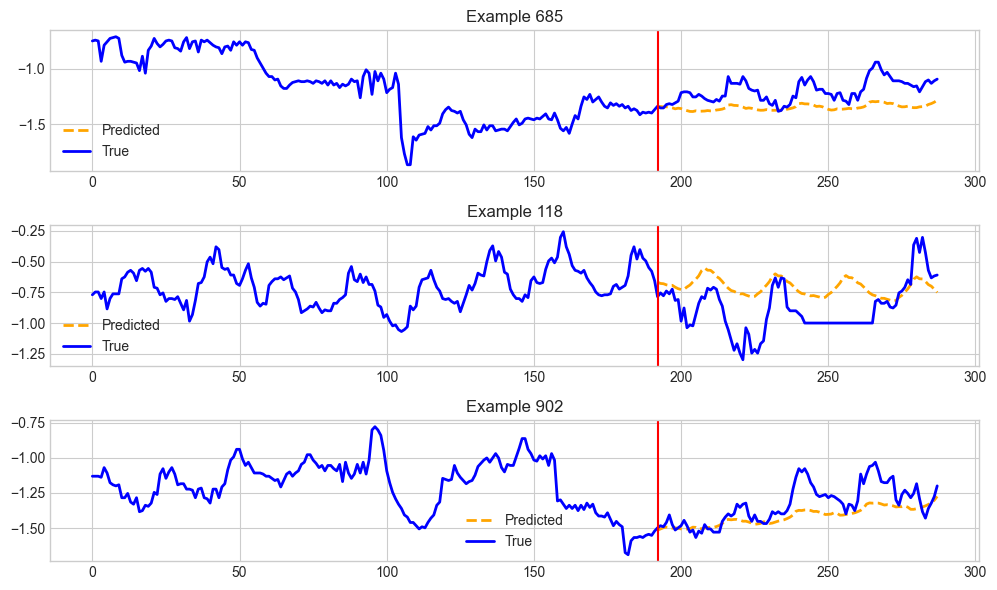

In [8]:
predictions_dict = zeroshot_eval(
    dataset_name=TARGET_DATASET, context_length=CONTEXT_LENGTH, forecast_length=PREDICTION_LENGTH, batch_size=64
)

 ## Few-shot finetune and evaluation method

In [9]:
def fewshot_finetune_eval(
    dataset_name,
    batch_size,
    learning_rate=None,
    context_length=512,
    forecast_length=96,
    fewshot_percent=100,
    freeze_backbone=True,
    num_epochs=10,
    save_dir=OUT_DIR,
    loss="mse",
    quantile=0.5,
):
    out_dir = os.path.join(save_dir, dataset_name)

    print("-" * 20, f"Running few-shot {fewshot_percent}%", "-" * 20)

    # Data prep: Get dataset
    

    tsp = TimeSeriesPreprocessor(
        **column_specifiers,
        context_length=context_length,
        prediction_length=forecast_length,
        scaling=True,
        encode_categorical=False,
        scaler_type="standard",
    )
    print("+" * 20, "TSP values", "+" * 20)
    print(tsp.prediction_channel_indices)
    print(tsp.exogenous_channel_indices)
    print(tsp.context_length)
    print(tsp.prediction_length)
    print(tsp.num_input_channels)
    print(tsp.scaler_type)




    # change head dropout to 0.7 for ett datasets
    if "ett" in dataset_name:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            prediction_channel_indices=tsp.prediction_channel_indices,
            num_input_channels=tsp.num_input_channels,

            head_dropout=0.4,
            loss=loss,
            quantile=quantile,
        )
    else:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            loss=loss,
            quantile=quantile,
        )

    dset_train, dset_val, dset_test = get_datasets(
        tsp,
        data,
        split_config,
        fewshot_fraction=fewshot_percent / 100,
        fewshot_location="first",
        use_frequency_token=finetune_forecast_model.config.resolution_prefix_tuning,
        
    )
    print("after get_datasets ------", len(dset_train))

    if freeze_backbone:
        print(
            "Number of params before freezing backbone",
            count_parameters(finetune_forecast_model),
        )

        # Freeze the backbone of the model
        for param in finetune_forecast_model.backbone.parameters():
            param.requires_grad = False

        # Count params
        print(
            "Number of params after freezing the backbone",
            count_parameters(finetune_forecast_model),
        )

    # Find optimal learning rate
    # Use with caution: Set it manually if the suggested learning rate is not suitable
    if learning_rate is None:
        learning_rate, finetune_forecast_model = optimal_lr_finder(
            finetune_forecast_model,
            dset_train,
            batch_size=batch_size,
        )
        print("OPTIMAL SUGGESTED LEARNING RATE =", learning_rate)

    print(f"Using learning rate = {learning_rate}")
    finetune_forecast_args = TrainingArguments(
        output_dir=os.path.join(out_dir, "v3_output"),
        overwrite_output_dir=True,
        learning_rate=learning_rate,
        num_train_epochs=num_epochs,
        do_eval=True,
        eval_strategy="epoch",
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        dataloader_num_workers=8,
        report_to="none",
        save_strategy="epoch",
        logging_strategy="epoch",
        save_total_limit=1,
        logging_dir=os.path.join(out_dir, "logs"),  # Make sure to specify a logging directory
        load_best_model_at_end=True,  # Load the best model when training ends
        metric_for_best_model="eval_loss",  # Metric to monitor for early stopping
        greater_is_better=False,  # For loss
        seed=SEED,
    )

    # Create the early stopping callback
    early_stopping_callback = EarlyStoppingCallback(
        early_stopping_patience=5,  # Number of epochs with no improvement after which to stop
        early_stopping_threshold=1e-5,  # Minimum improvement required to consider as improvement
    )
    tracking_callback = TrackingCallback()

    # Optimizer and scheduler
    optimizer = AdamW(finetune_forecast_model.parameters(), lr=learning_rate)
    scheduler = OneCycleLR(
        optimizer,
        learning_rate,
        epochs=num_epochs,
        steps_per_epoch=math.ceil(len(dset_train) / (batch_size)),
    )

    finetune_forecast_trainer = Trainer(
        model=finetune_forecast_model,
        args=finetune_forecast_args,
        train_dataset=dset_train,
        eval_dataset=dset_val,
        callbacks=[early_stopping_callback, tracking_callback],
        optimizers=(optimizer, scheduler),
    )
    finetune_forecast_trainer.remove_callback(INTEGRATION_TO_CALLBACK["codecarbon"])

    # Fine tune
    finetune_forecast_trainer.train()

    # Evaluation
    print("+" * 20, f"Test MSE after few-shot {fewshot_percent}% fine-tuning", "+" * 20)

    finetune_forecast_trainer.model.loss = "mse"  # fixing metric to mse for evaluation

    fewshot_output = finetune_forecast_trainer.evaluate(dset_test)
    print(fewshot_output)
    print("+" * 60)

    # get predictions

    predictions_dict = finetune_forecast_trainer.predict(dset_test)
    print("prediction metrics on test set", predictions_dict[2])

    predictions_np = predictions_dict.predictions[0]

    print(predictions_np.shape)

    # get backbone embeddings (if needed for further analysis)

    backbone_embedding = predictions_dict.predictions[1]

    print(backbone_embedding.shape)

    # plot
    plot_predictions(
        model=finetune_forecast_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_fewshot",
        indices=[685, 118, 902],
        channel=0,
    )
    return predictions_dict

### Fine-tuning on full dataset (using 100% train split)

In [ ]:
fewshot_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=CONTEXT_LENGTH,
    forecast_length=PREDICTION_LENGTH,
    batch_size=64,
    fewshot_percent=100,
    learning_rate=0.001,
    num_epochs=20,
)

# Analysis of TTM model on ETTh1 data

In [144]:
tsp = TimeSeriesPreprocessor(
    **column_specifiers,
    context_length=CONTEXT_LENGTH,
    prediction_length=PREDICTION_LENGTH,
    scaling=True,
    encode_categorical=False,
    scaler_type="standard",
)

dset_train, dset_val, dset_test = get_datasets(
        tsp,
        data,
        split_config,
        fewshot_fraction=1,
        fewshot_location="first",
        use_frequency_token=None,
    )
print("Length of train/val/test", len(dset_train), len(dset_val), len(dset_test))

print("Prediction channel indices derived from the preprocessor(TSP) methods - ", tsp.prediction_channel_indices)
print("Exogenous channel indices derived from the preprocessor(TSP) methods - ", tsp.exogenous_channel_indices)


Length of train/val/test 8033 2785 2785
Prediction channel indices derived from the preprocessor(TSP) methods -  [0]
Exogenous channel indices derived from the preprocessor(TSP) methods -  []


# Performance check on Validation set (Zero-shot and Finetuned model)

### Zero-shot 

In [11]:
# Load model
zeroshot_val_model = get_model(
    TTM_MODEL_PATH,
    context_length=CONTEXT_LENGTH,
    prediction_length=PREDICTION_LENGTH,
    freq_prefix_tuning=False,
    freq=None,
    prefer_l1_loss=False,
    prefer_longer_context=True,
    # adding TTM model config
    prediction_channel_indices=tsp.prediction_channel_indices,
    num_input_channels=tsp.num_input_channels,
)
temp_dir = tempfile.mkdtemp()

# zeroshot_trainer
zeroshot_val_trainer = Trainer(
    model=zeroshot_val_model,
    args=TrainingArguments(
        output_dir=temp_dir,
        per_device_eval_batch_size=BATCH_SIZE,
        seed=SEED,
        report_to="none",
    ),
)
# evaluate = zero-shot performance
print("+" * 20, "Val MSE zero-shot", "+" * 20)
zeroshot_val_output = zeroshot_val_trainer.evaluate(dset_val)
print("zeroshot performance on validation set", zeroshot_val_output)


INFO:p-41972:t-8466403200:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-41972:t-8466403200:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-41972:t-8466403200:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


++++++++++++++++++++ Val MSE zero-shot ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


zeroshot performance on validation set {'eval_loss': 0.10167164355516434, 'eval_model_preparation_time': 0.0012, 'eval_runtime': 0.7323, 'eval_samples_per_second': 3802.905, 'eval_steps_per_second': 60.082}


### Fine-tuned 

In [12]:
# loading the fine-tuned TTM model

fine_tuned_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/output/checkpoint-504")
temp_dir = tempfile.mkdtemp()

localfinetuned_trainer = Trainer(
        model=fine_tuned_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

print("+" * 20, "Val MSE fine-tuned", "+" * 20)
finetuned_val_output = localfinetuned_trainer.evaluate(dset_val)
print("finetuned performance on validation set", finetuned_val_output)


++++++++++++++++++++ Val MSE fine-tuned ++++++++++++++++++++


finetuned performance on validation set {'eval_loss': 0.09184487909078598, 'eval_model_preparation_time': 0.0011, 'eval_runtime': 0.6361, 'eval_samples_per_second': 4378.011, 'eval_steps_per_second': 69.168}


In [13]:
# number of True values of the mask
num_true = dset_val[1100]["future_observed_mask"].sum().item()
print(num_true)

96


In [14]:
zs_val_preds = zeroshot_val_trainer.predict(dset_val)
ft_val_preds = localfinetuned_trainer.predict(dset_val)

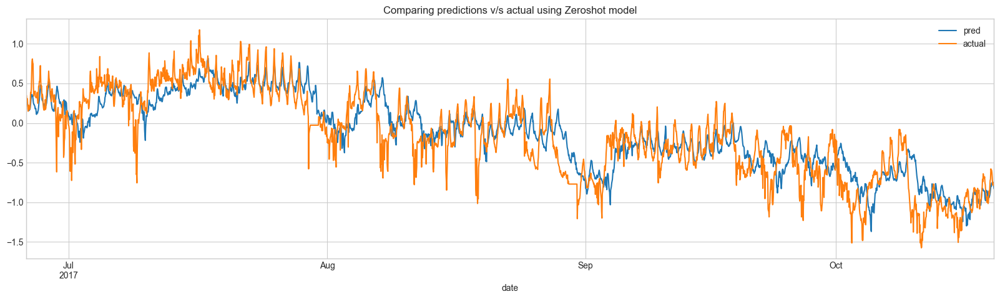

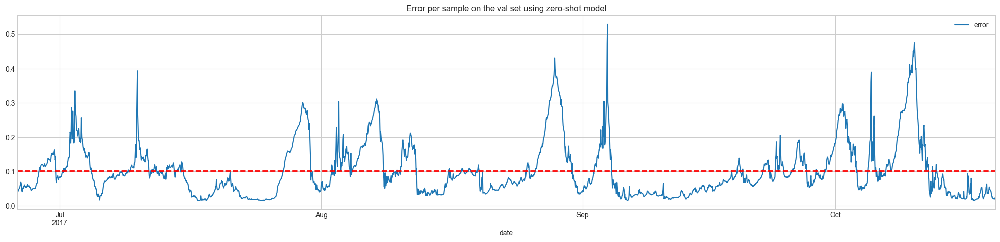

In [15]:
zs_forecast_df = construct_output_df(dset_val, zeroshot_val_trainer)
zs_out_predictions = compare_forecast(zs_forecast_df, "date", "prediction", "actual", 24)
zs_out_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using Zeroshot model")

zs_forecast_df["error"] = zs_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax1 = zs_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the val set using zero-shot model")
ax1.axhline(y=zs_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {zs_forecast_df['error'].mean():.3f}")


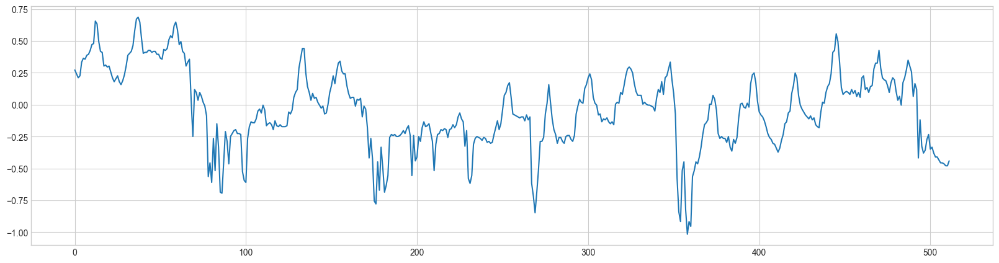

In [674]:
plt.figure(figsize=(20,5))
plt.plot(zs_forecast_df["context"].iloc[1475])

In [667]:
zs_forecast_df[(zs_forecast_df["date"]> "2017-08-26") &  (zs_forecast_df["date"]<"2017-08-27")]

,date,prediction,actual,context,full_window,error
1466,2017-08-26 01:00:00,"[-0.3452686, -0.32082903, -0.29866853, -0.2964...","[-0.40998912, -0.40998912, -0.4329827, -0.4559...","[0.3872654, 0.23393887, 0.18795191, 0.20331712...","[0.3872654, 0.23393887, 0.18795191, 0.20331712...",0.085082
1467,2017-08-26 02:00:00,"[-0.38537684, -0.3500064, -0.3394889, -0.33931...","[-0.40998912, -0.4329827, -0.4559762, -0.45597...","[0.23393887, 0.18795191, 0.20331712, 0.2033171...","[0.23393887, 0.18795191, 0.20331712, 0.2033171...",0.084055
1468,2017-08-26 03:00:00,"[-0.37731624, -0.35604286, -0.3441363, -0.3218...","[-0.4329827, -0.4559762, -0.4559762, -0.463604...","[0.18795191, 0.20331712, 0.20331712, 0.1803237...","[0.18795191, 0.20331712, 0.20331712, 0.1803237...",0.088480
1469,2017-08-26 04:00:00,"[-0.39703906, -0.38067055, -0.34648773, -0.316...","[-0.4559762, -0.4559762, -0.46360445, -0.47896...","[0.20331712, 0.20331712, 0.18032375, 0.2493043...","[0.20331712, 0.20331712, 0.18032375, 0.2493043...",0.089397
1470,2017-08-26 05:00:00,"[-0.43514514, -0.39364558, -0.35438645, -0.332...","[-0.4559762, -0.46360445, -0.47896978, -0.4789...","[0.20331712, 0.18032375, 0.2493043, 0.25693247...","[0.20331712, 0.18032375, 0.2493043, 0.25693247...",0.088520
1471,2017-08-26 06:00:00,"[-0.4162589, -0.37258554, -0.34616694, -0.3224...","[-0.46360445, -0.47896978, -0.47896978, -0.440...","[0.18032375, 0.2493043, 0.25693247, 0.25693247...","[0.18032375, 0.2493043, 0.25693247, 0.25693247...",0.091832
1472,2017-08-26 07:00:00,"[-0.42810887, -0.3954395, -0.36904556, -0.3465...","[-0.47896978, -0.47896978, -0.44061086, -0.371...","[0.2493043, 0.25693247, 0.25693247, 0.2722979,...","[0.2493043, 0.25693247, 0.25693247, 0.2722979,...",0.094822
1473,2017-08-26 08:00:00,"[-0.44469795, -0.40750065, -0.3833307, -0.3501...","[-0.47896978, -0.44061086, -0.37163022, -0.409...","[0.25693247, 0.25693247, 0.2722979, 0.24156702...","[0.25693247, 0.25693247, 0.2722979, 0.24156702...",0.095523
1474,2017-08-26 09:00:00,"[-0.45391196, -0.42018414, -0.388392, -0.35733...","[-0.44061086, -0.37163022, -0.40998912, -0.417...","[0.25693247, 0.2722979, 0.24156702, 0.21094528...","[0.25693247, 0.2722979, 0.24156702, 0.21094528...",0.102262
1475,2017-08-26 10:00:00,"[-0.4244953, -0.38345805, -0.35352257, -0.3029...","[-0.37163022, -0.40998912, -0.41761738, -0.341...","[0.2722979, 0.24156702, 0.21094528, 0.22631072...","[0.2722979, 0.24156702, 0.21094528, 0.22631072...",0.104094


In [16]:
high_error_val_samples = zs_forecast_df[zs_forecast_df["error"]>0.3]
high_error_val_samples

,date,prediction,actual,context,full_window,error
164,2017-07-02 19:00:00,"[-0.35367614, -0.30752498, -0.29037648, -0.280...","[-0.15706019, -0.21067552, -0.087970726, 0.019...","[-0.087970726, -0.034355395, 0.09597776, 0.065...","[-0.087970726, -0.034355395, 0.09597776, 0.065...",0.335338
341,2017-07-10 04:00:00,"[-0.47852975, -0.40978694, -0.3599239, -0.3241...","[-0.7550012, -0.32564315, -0.15706019, 0.04225...","[0.04225352, 0.019259933, 0.019259933, -0.0419...","[0.04225352, 0.019259933, 0.019259933, -0.0419...",0.331496
342,2017-07-10 05:00:00,"[-0.5858241, -0.5110556, -0.45926154, -0.43242...","[-0.32564315, -0.15706019, 0.04225352, 0.00400...","[0.019259933, 0.019259933, -0.04198355, -0.026...","[0.019259933, 0.019259933, -0.04198355, -0.026...",0.393866
813,2017-07-29 20:00:00,"[0.41458386, 0.41662893, 0.4157063, 0.41637266...","[0.3336503, 0.30291963, 0.2876631, 0.2493043, ...","[0.2876631, 0.27992603, 0.23393887, 0.34127843...","[0.2876631, 0.27992603, 0.23393887, 0.34127843...",0.300644
915,2017-08-03 02:00:00,"[-0.5087057, -0.48794407, -0.49088633, -0.4903...","[-0.19531009, -0.1340667, -0.087970726, -0.087...","[0.6401944, 0.58657914, 0.5252267, 0.4638743, ...","[0.6401944, 0.58657914, 0.5252267, 0.4638743, ...",0.303325
...,...,...,...,...,...,...
2556,2017-10-10 11:00:00,"[-0.3009752, -0.2899364, -0.29345128, -0.29891...","[-0.40236098, -0.34863672, -0.5173287, -0.5939...","[-0.087970726, -0.08034236, -0.1340667, -0.134...","[-0.087970726, -0.08034236, -0.1340667, -0.134...",0.415840
2557,2017-10-10 12:00:00,"[-0.33110362, -0.33312932, -0.3402715, -0.3500...","[-0.34863672, -0.5173287, -0.5939374, -0.70901...","[-0.08034236, -0.1340667, -0.1340667, -0.12632...","[-0.08034236, -0.1340667, -0.1340667, -0.12632...",0.398512
2558,2017-10-10 13:00:00,"[-0.32190856, -0.3293291, -0.34422374, -0.3606...","[-0.5173287, -0.5939374, -0.7090141, -0.823981...","[-0.1340667, -0.1340667, -0.12632954, 0.004003...","[-0.1340667, -0.1340667, -0.12632954, 0.004003...",0.400958
2559,2017-10-10 14:00:00,"[-0.43726188, -0.43838382, -0.4520223, -0.4667...","[-0.5939374, -0.7090141, -0.82398176, -0.84697...","[-0.1340667, -0.12632954, 0.004003624, 0.01925...","[-0.1340667, -0.12632954, 0.004003624, 0.01925...",0.355581


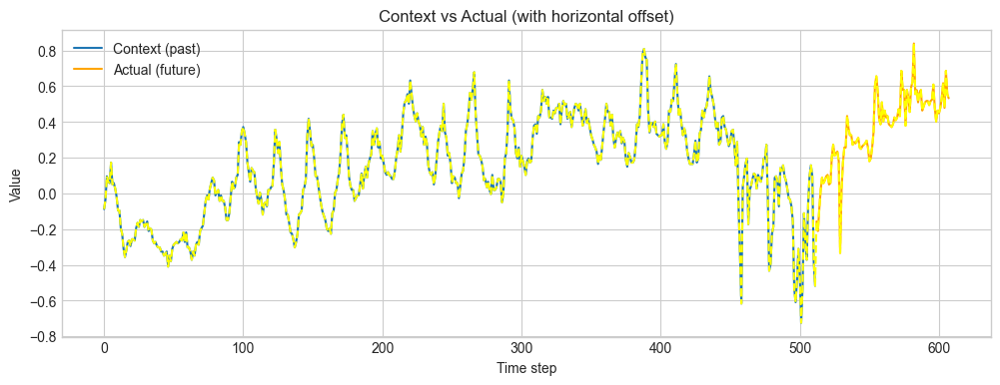

In [17]:
sample = zs_forecast_df[zs_forecast_df["error"] > 0.3].iloc[0]

context = np.array(sample["context"])
actual = np.array(sample["actual"])

plt.figure(figsize=(12, 4))

# Plot context (past window)
plt.plot(range(len(context)), context, label="Context (past)")

# Plot actual (future window) starting at offset 512
offset = len(context)
plt.plot(range(offset, offset + len(actual)), actual, label="Actual (future)", color='orange')
plt.plot(zs_forecast_df[zs_forecast_df["error"]>0.3]["full_window"].iloc[0], color= "yellow", linestyle = "--")

plt.title("Context vs Actual (with horizontal offset)")
plt.xlabel("Time step")
plt.ylabel("Value")
plt.legend()
plt.show()

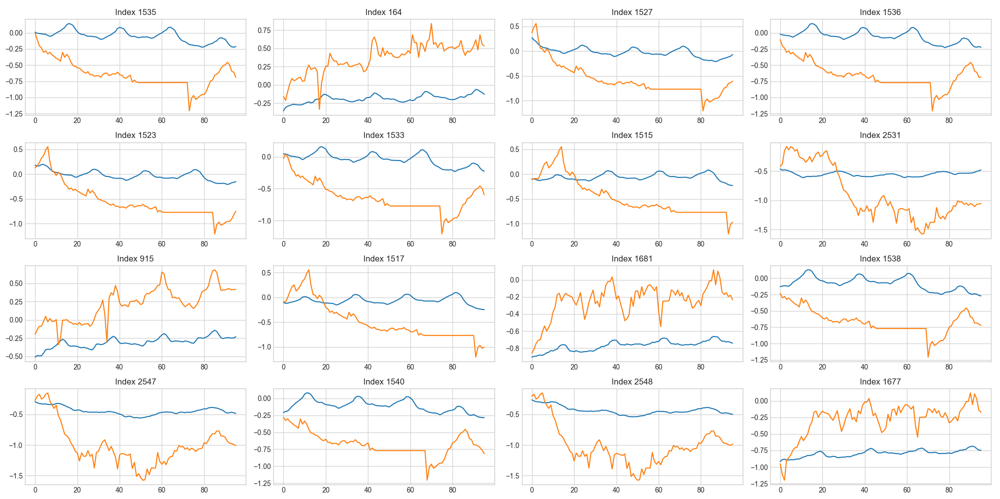

In [18]:
plot_high_error_samples(4, 4, zs_forecast_df, 0.3)


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


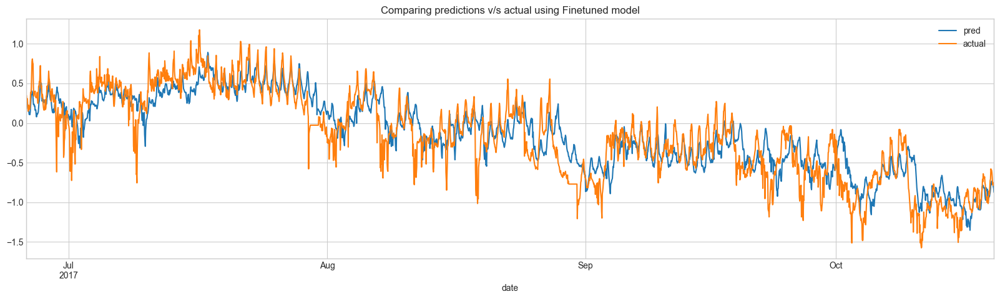

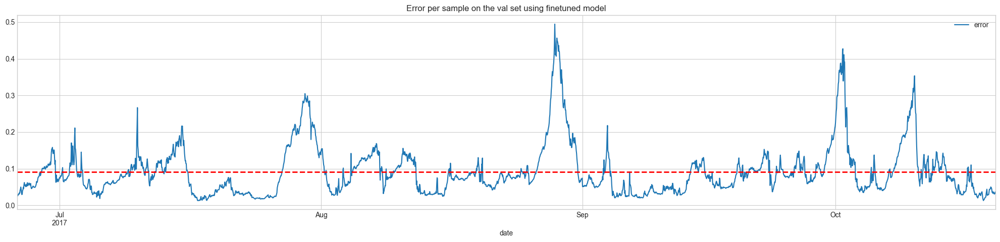

In [19]:
ft_forecast_df = construct_output_df(dset_val, localfinetuned_trainer)
ft_out_predictions = compare_forecast(ft_forecast_df, "date", "prediction", "actual", 24)
ft_out_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using Finetuned model")

ft_forecast_df["error"] = ft_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax = ft_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the val set using finetuned model")
ax.axhline(y=ft_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {ft_forecast_df['error'].mean():.3f}")

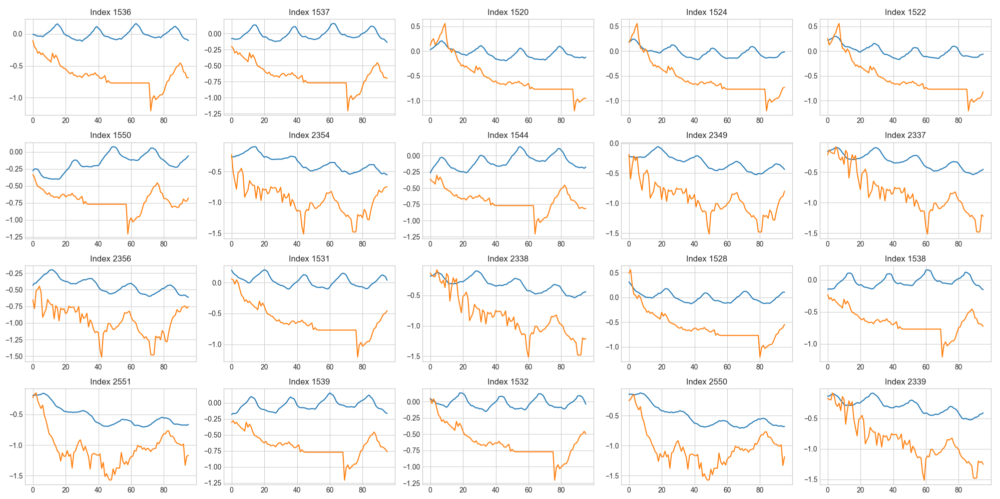

In [20]:
plot_high_error_samples(4, 5, ft_forecast_df, 0.3)

# Performance check on Test set (Zero-shot and Finetuned model)

### Zeroshot

In [21]:
# Load model
zeroshot_test_model = get_model(
    TTM_MODEL_PATH,
    context_length=CONTEXT_LENGTH,
    prediction_length=PREDICTION_LENGTH,
    freq_prefix_tuning=False,
    freq=None,
    prefer_l1_loss=False,
    prefer_longer_context=True,
    # adding TTM model config
    prediction_channel_indices=tsp.prediction_channel_indices,
    num_input_channels=tsp.num_input_channels,
)
temp_dir = tempfile.mkdtemp()

# zeroshot_trainer
zeroshot_test_trainer = Trainer(
    model=zeroshot_test_model,
    args=TrainingArguments(
        output_dir=temp_dir,
        per_device_eval_batch_size=BATCH_SIZE,
        seed=SEED,
        report_to="none",
    ),
)
# evaluate = zero-shot performance
print("+" * 20, "Test MSE zero-shot", "+" * 20)
zeroshot_test_output = zeroshot_test_trainer.evaluate(dset_test)
print("zeroshot performance on test set", zeroshot_test_output)

INFO:p-41972:t-8466403200:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-41972:t-8466403200:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-41972:t-8466403200:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


++++++++++++++++++++ Test MSE zero-shot ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


zeroshot performance on test set {'eval_loss': 0.05244337394833565, 'eval_model_preparation_time': 0.0012, 'eval_runtime': 0.762, 'eval_samples_per_second': 3654.631, 'eval_steps_per_second': 57.739}


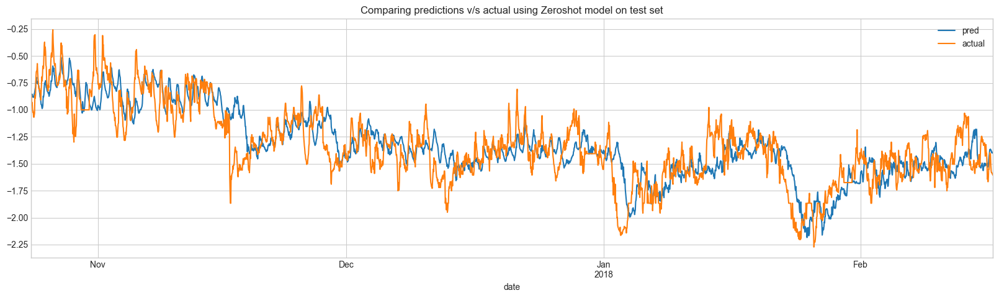

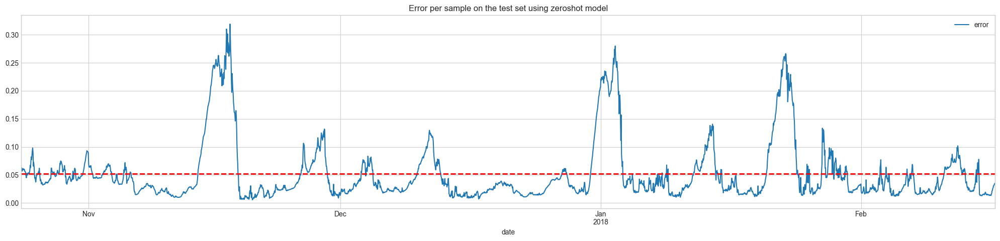

In [22]:
zs_test_forecast_df = construct_output_df(dset_test, zeroshot_val_trainer)
zs_test_predictions = compare_forecast(zs_test_forecast_df, "date", "prediction", "actual", 24)
zs_test_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using Zeroshot model on test set")

zs_test_forecast_df["error"] = zs_test_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax2 = zs_test_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the test set using zeroshot model")
ax2.axhline(y=zs_test_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {zs_test_forecast_df['error'].mean():.3f}")

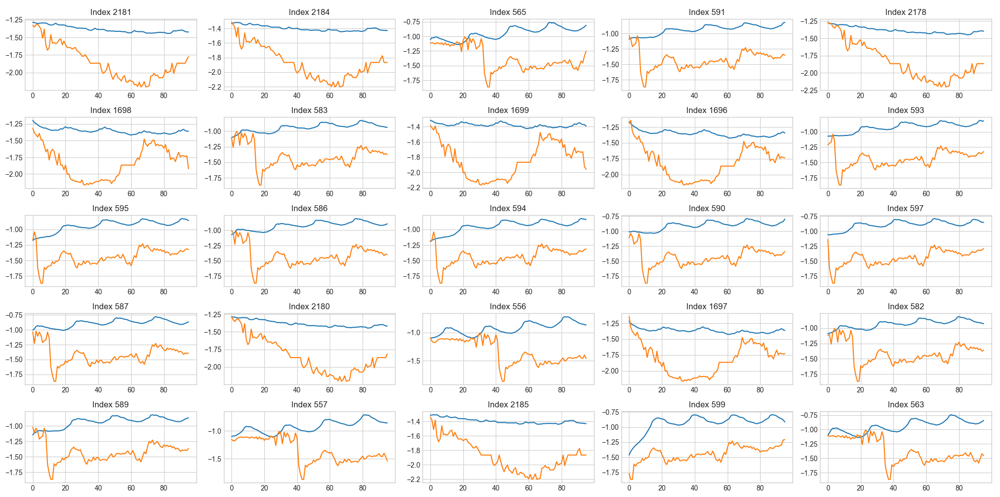

In [23]:
plot_high_error_samples(5, 5, zs_test_forecast_df, 0.25)

### Fine-Tuned

In [24]:
fine_tuned_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/do_0.4_output/checkpoint-126")
temp_dir = tempfile.mkdtemp()

localfinetuned_trainer = Trainer(
        model=fine_tuned_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

print("+" * 20, "Val MSE fine-tuned", "+" * 20)
finetuned_test_output = localfinetuned_trainer.evaluate(dset_test)
print("finetuned performance on validation set", finetuned_test_output)

++++++++++++++++++++ Val MSE fine-tuned ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


finetuned performance on validation set {'eval_loss': 0.04930831864476204, 'eval_model_preparation_time': 0.0012, 'eval_runtime': 0.6876, 'eval_samples_per_second': 4050.548, 'eval_steps_per_second': 63.994}


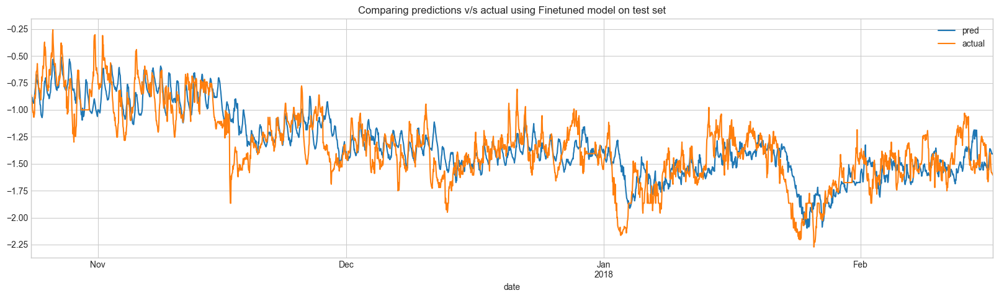

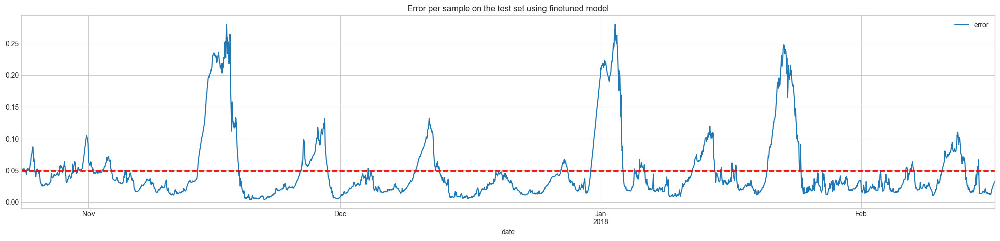

In [25]:
ft_test_forecast_df = construct_output_df(dset_test, localfinetuned_trainer)
ft_test_predictions = compare_forecast(ft_test_forecast_df, "date", "prediction", "actual", 24)
ft_test_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using Finetuned model on test set")

ft_test_forecast_df["error"] = ft_test_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax3 = ft_test_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the test set using finetuned model")
ax3.axhline(y=ft_test_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {ft_test_forecast_df['error'].mean():.3f}")

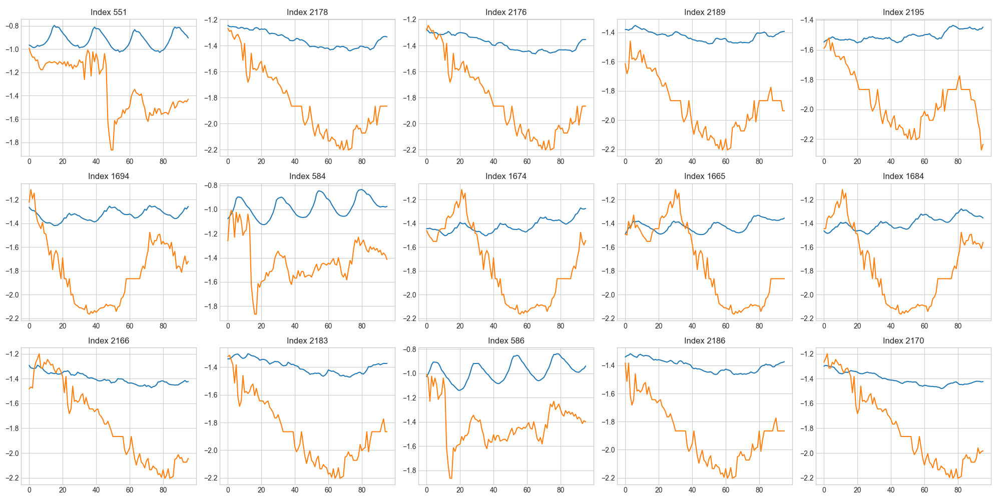

In [26]:
plot_high_error_samples(3, 5, ft_test_forecast_df, 0.2)

# Exchange Rate dataset

### Performance of model fine-tuned on exchange rate on ETTh1 data 

In [26]:
print("Length of train/val/test", len(dset_train), len(dset_val), len(dset_test))

Length of train/val/test 8033 2785 2785


In [27]:
fine_tuned_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/exchange_rate/output/checkpoint-518")
temp_dir = tempfile.mkdtemp()

finetuned_trainer = Trainer(
        model=fine_tuned_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

print("+" * 20, "Val MSE fine-tuned", "+" * 20)
finetuned_val_output = finetuned_trainer.evaluate(dset_test)
print("finetuned performance on validation set", finetuned_val_output)

++++++++++++++++++++ Val MSE fine-tuned ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


finetuned performance on validation set {'eval_loss': 0.07437445968389511, 'eval_model_preparation_time': 0.0011, 'eval_runtime': 0.6453, 'eval_samples_per_second': 4316.009, 'eval_steps_per_second': 68.188}


In [28]:
# targeted fine tuning using samples similar to high error regions of ETTh1 dataset
from sklearn.preprocessing import StandardScaler

training_data = data[0:8640]
df_nw = training_data["OT"]

scaler = StandardScaler()
df_scaled = scaler.fit_transform(np.asarray(df_nw).reshape(-1, 1)) 


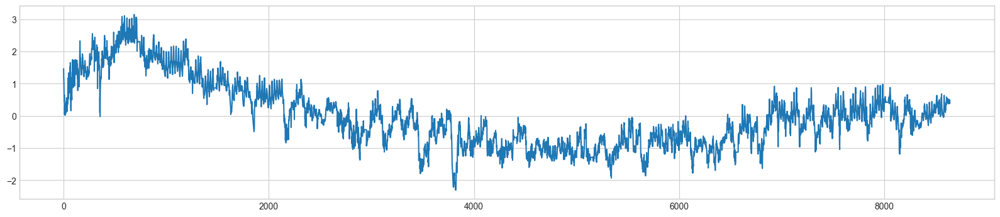

In [29]:
plt.figure(figsize=(20,4))
plt.plot(df_scaled)

In [30]:
columns = ["ETTh1", "Validation", "Test"]
rows = [
    ["ZS", 0.1016, 0.0524],
    ["FT", 0.0918, 0.0493], 
]
res_df = pd.DataFrame(rows, columns=columns)
print(res_df)
print("Using fine-tuned model on exchange rate to predict on ETTh1 test set, MSE :", 0.0743 )


  ETTh1  Validation    Test
0    ZS      0.1016  0.0524
1    FT      0.0918  0.0493
Using fine-tuned model on exchange rate to predict on ETTh1 test set, MSE : 0.0743


### clustering samples with high error threshold in val set to find matching samples in train set to create targeted set.

In [31]:
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import sktime
from sktime.clustering.k_means import TimeSeriesKMeans
from sklearn.metrics import silhouette_score

In [33]:
value_df = pd.DataFrame(
    high_error_val_samples['full_window'].tolist(),
    index=high_error_val_samples.index,
    columns=[f'timepoint_{i}' for i in range(len(high_error_val_samples['full_window'].iloc[0]))]
)

print(f"Shape: {value_df.shape}")
value_df

Shape: (83, 608)


,timepoint_0,timepoint_1,timepoint_2,timepoint_3,timepoint_4,timepoint_5,timepoint_6,timepoint_7,timepoint_8,timepoint_9,...,timepoint_598,timepoint_599,timepoint_600,timepoint_601,timepoint_602,timepoint_603,timepoint_604,timepoint_605,timepoint_606,timepoint_607
164,-0.087971,-0.034355,0.095978,0.065247,0.057619,0.172586,0.049991,0.057619,0.026997,-0.018990,...,0.402631,0.463874,0.448618,0.479240,0.532964,0.617201,0.479240,0.686291,0.555957,0.532964
341,0.042254,0.019260,0.019260,-0.041984,-0.026727,-0.011362,-0.011362,0.049991,0.111343,0.026997,...,0.670925,0.532964,0.632566,0.555957,0.563586,0.532964,0.594207,0.571214,0.555957,0.563586
342,0.019260,0.019260,-0.041984,-0.026727,-0.011362,-0.011362,0.049991,0.111343,0.026997,0.103606,...,0.532964,0.632566,0.555957,0.563586,0.532964,0.594207,0.571214,0.555957,0.563586,0.532964
813,0.287663,0.279926,0.233939,0.341278,0.287663,0.371900,0.440881,0.463874,0.448618,0.410259,...,-0.141695,-0.126330,-0.064977,-0.241297,-0.111073,-0.072714,-0.180054,-0.471342,-0.455976,-0.402361
915,0.640194,0.586579,0.525227,0.463874,0.540592,0.540592,0.494605,0.647932,0.502233,0.601945,...,0.647932,0.517599,0.402631,0.410259,0.410259,0.425624,0.425624,0.410259,0.417887,0.417887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2556,-0.087971,-0.080342,-0.134067,-0.134067,-0.126330,0.004004,0.019260,0.004004,0.080612,0.126600,...,-1.007930,-0.984937,-1.329949,-1.184250,-1.168885,-1.076911,-1.015558,-1.030924,-0.977308,-0.961943
2557,-0.080342,-0.134067,-0.134067,-0.126330,0.004004,0.019260,0.004004,0.080612,0.126600,0.088240,...,-0.984937,-1.329949,-1.184250,-1.168885,-1.076911,-1.015558,-1.030924,-0.977308,-0.961943,-0.992565
2558,-0.134067,-0.134067,-0.126330,0.004004,0.019260,0.004004,0.080612,0.126600,0.088240,0.034625,...,-1.329949,-1.184250,-1.168885,-1.076911,-1.015558,-1.030924,-0.977308,-0.961943,-0.992565,-0.938949
2559,-0.134067,-0.126330,0.004004,0.019260,0.004004,0.080612,0.126600,0.088240,0.034625,-0.011362,...,-1.184250,-1.168885,-1.076911,-1.015558,-1.030924,-0.977308,-0.961943,-0.992565,-0.938949,-0.931321


In [34]:
X = value_df.values[:, np.newaxis, :]
X.shape

(83, 1, 608)

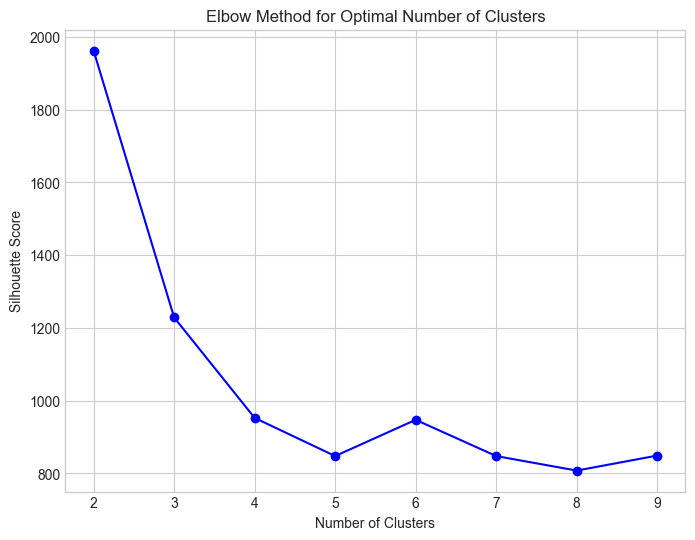

In [35]:
sum_of_squared_dist = []
K = range(2, 10)
# Fit models and calculate silhouette scores for each number of clusters
silhouette_scores = []
for n_clusters in K:
    
    km = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", verbose=False, max_iter=10, random_state=22)
    km = km.fit(X)
    sum_of_squared_dist.append(km.inertia_)
# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(K, sum_of_squared_dist, "bx--", marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [36]:
# For sktime, you might need to reshape this
model = TimeSeriesKMeans(
    n_clusters   = 4,
    metric       = "dtw",
    max_iter     = 10,
    random_state = 123456
)
labels = model.fit_predict(X)
print(f"\nCluster labels: {labels}")
print(f"Cluster sizes: {pd.Series(labels).value_counts().sort_index()}")


Cluster labels: [2 2 2 3 3 3 3 3 3 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
Cluster sizes: 0    33
1    34
2     9
3     7
Name: count, dtype: int64


<Figure size 1200x900 with 0 Axes>

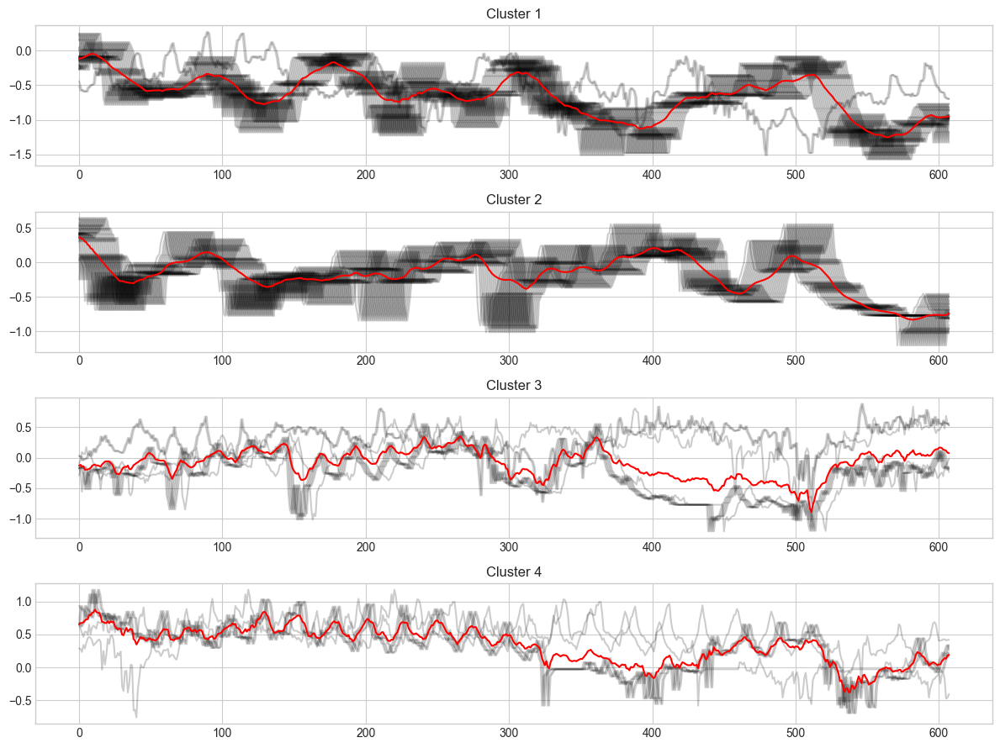

In [53]:
n_clusters = 4
plt.figure(figsize=(12, 9))
# Visualizing the clustering results
plt.figure(figsize=(12, 9))
for yi in range(n_clusters):
    plt.subplot(n_clusters, 1, 1 + yi)
    for xx in X[labels == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(model.cluster_centers_[yi].ravel(), "r-")
    plt.title("Cluster %d" % (yi + 1))

plt.tight_layout()
plt.show()

### Curate training samples similar to clusters identified from high error regions in Validation set

In [37]:
import torch

train_samples = []
timestamps = []

for i in range(len(dset_train)):
    sample = torch.cat((dset_train[i]['past_values'], dset_train[i]['future_values']), dim=0)
    train_samples.append(sample)

    timestamps.append(dset_train[i]['timestamp']) 

train_data = torch.stack(train_samples).squeeze(-1).numpy()
train_data_reshaped = np.expand_dims(train_data, axis=1)
columns = [f"timepoint_{i}" for i in range(train_data.shape[1])]
train_df = pd.DataFrame(train_data, columns=columns)
train_df["timestamp"] = timestamps
train_df.set_index("timestamp", inplace=True)

In [39]:
# use the clustering model to predict the clusters of the train samples
y_preds_test = model.predict(train_data_reshaped)
cluster_centers = model.cluster_centers_

In [257]:
pd.Series(y_preds_test).value_counts().sort_index()

0    3241
1     352
2    2161
3    2279
Name: count, dtype: int64

In [42]:
train_data_reshaped.shape

(8033, 1, 608)

In [43]:
distances = []
for i, (sample, label) in enumerate(zip(train_df.values, y_preds_test)):
    
    center = cluster_centers[label]
    sample = train_df.iloc[i].values
    timestamp = train_df.index[i]
    from sktime.distances import dtw_distance
    dist = dtw_distance(sample, center)
     
    distances.append({
        'sample' : sample,
        'sample_idx': i,
        'cluster': label,
        'distance': dist,
        'timestamp': timestamp
    })

In [191]:
dist_df = pd.DataFrame(distances)

# select the timestamped observations closest to cluster centers in train set to curate the targeted training set
top_k_dict, top_k_list = get_top_k_timestamps_per_cluster(dist_df, k=200, ascending=True)
print(len(top_k_list))

timestamps_to_keep = set(top_k_list) 

keep_indices = [
    i for i in range(len(dset_train))
    if dset_train[i]['timestamp'] in timestamps_to_keep
]

from torch.utils.data import Subset

dset_train_filtered = Subset(dset_train, keep_indices)


800


In [158]:
# targeted training of model 

def targeted_finetune_eval(
    dataset_name,
    batch_size,
    learning_rate=None,
    context_length=512,
    forecast_length=96,
    fewshot_percent=100,
    freeze_backbone=True,
    num_epochs=10,
    save_dir=OUT_DIR,
    loss="mse",
    quantile=0.5,
):
    out_dir = os.path.join(save_dir, dataset_name)

    print("-" * 20, f"Running few-shot {fewshot_percent}%", "-" * 20)

    # Data prep: Get dataset
    

    # tsp = TimeSeriesPreprocessor(
    #     **column_specifiers,
    #     context_length=context_length,
    #     prediction_length=forecast_length,
    #     scaling=True,
    #     encode_categorical=False,
    #     scaler_type="standard",
    # )
    # print("+" * 20, "TSP values", "+" * 20)
    # print(tsp.prediction_channel_indices)
    # print(tsp.exogenous_channel_indices)
    # print(tsp.context_length)
    # print(tsp.prediction_length)
    # print(tsp.num_input_channels)
    # print(tsp.scaler_type)




    # change head dropout to 0.7 for ett datasets
    if "ett" in dataset_name:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            prediction_channel_indices=tsp.prediction_channel_indices,
            num_input_channels=tsp.num_input_channels,

            head_dropout=0.7,
            loss=loss,
            quantile=quantile,
        )
    else:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            loss=loss,
            quantile=quantile,
        )

    # dset_train, dset_val, dset_test = get_datasets(
    #     tsp,
    #     data,
    #     split_config,
    #     fewshot_fraction=fewshot_percent / 100,
    #     fewshot_location="first",
    #     use_frequency_token=finetune_forecast_model.config.resolution_prefix_tuning,
        
    # )
    # print("after get_datasets ------", len(dset_train))

    if freeze_backbone:
        print(
            "Number of params before freezing backbone",
            count_parameters(finetune_forecast_model),
        )

        # Freeze the backbone of the model
        for param in finetune_forecast_model.backbone.parameters():
            param.requires_grad = False

        # Count params
        print(
            "Number of params after freezing the backbone",
            count_parameters(finetune_forecast_model),
        )

    # Find optimal learning rate
    # Use with caution: Set it manually if the suggested learning rate is not suitable
    if learning_rate is None:
        learning_rate, finetune_forecast_model = optimal_lr_finder(
            finetune_forecast_model,
            dset_train,
            batch_size=batch_size,
        )
        print("OPTIMAL SUGGESTED LEARNING RATE =", learning_rate)

    print(f"Using learning rate = {learning_rate}")
    finetune_forecast_args = TrainingArguments(
        output_dir=os.path.join(out_dir, "v5_output"),
        overwrite_output_dir=True,
        learning_rate=learning_rate,
        num_train_epochs=num_epochs,
        do_eval=True,
        eval_strategy="epoch",
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        dataloader_num_workers=8,
        report_to="none",
        save_strategy="epoch",
        logging_strategy="epoch",
        save_total_limit=1,
        logging_dir=os.path.join(out_dir, "logs"),  # Make sure to specify a logging directory
        load_best_model_at_end=True,  # Load the best model when training ends
        metric_for_best_model="eval_loss",  # Metric to monitor for early stopping
        greater_is_better=False,  # For loss
        seed=SEED,
    )

    # Create the early stopping callback
    early_stopping_callback = EarlyStoppingCallback(
        early_stopping_patience=5,  # Number of epochs with no improvement after which to stop
        early_stopping_threshold=1e-5,  # Minimum improvement required to consider as improvement
    )
    tracking_callback = TrackingCallback()

    # Optimizer and scheduler
    optimizer = AdamW(finetune_forecast_model.parameters(), lr=learning_rate)
    scheduler = OneCycleLR(
        optimizer,
        learning_rate,
        epochs=num_epochs,
        steps_per_epoch=math.ceil(len(dset_train_filtered) / (batch_size)),
    )
    print("length of training set is", len(dset_train_filtered))
    
    finetune_forecast_trainer = Trainer(
        model=finetune_forecast_model,
        args=finetune_forecast_args,
        train_dataset=dset_train_filtered,
        eval_dataset=dset_val,
        callbacks=[early_stopping_callback, tracking_callback],
        optimizers=(optimizer, scheduler),
    )
    finetune_forecast_trainer.remove_callback(INTEGRATION_TO_CALLBACK["codecarbon"])

    # Fine tune
    finetune_forecast_trainer.train()

    # Evaluation
    print("+" * 20, f"Test MSE after few-shot {fewshot_percent}% fine-tuning", "+" * 20)

    finetune_forecast_trainer.model.loss = "mse"  # fixing metric to mse for evaluation

    fewshot_output = finetune_forecast_trainer.evaluate(dset_test)
    print(fewshot_output)
    print("+" * 60)

    # get predictions

    predictions_dict = finetune_forecast_trainer.predict(dset_test)
    print("prediction metrics on test set", predictions_dict[2])

    predictions_np = predictions_dict.predictions[0]

    print(predictions_np.shape)

    # get backbone embeddings (if needed for further analysis)

    backbone_embedding = predictions_dict.predictions[1]

    print(backbone_embedding.shape)

    # plot
    plot_predictions(
        model=finetune_forecast_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_fewshot",
        indices=[685, 118, 902],
        channel=0,
    )
    return predictions_dict

In [ ]:
targeted_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=CONTEXT_LENGTH,
    forecast_length=PREDICTION_LENGTH,
    batch_size=64,
    fewshot_percent=100,
    learning_rate=0.001,
    num_epochs=20,
)

In [31]:
targeted_tuned_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/v5_output/checkpoint-65")
temp_dir = tempfile.mkdtemp()

targeted_finetuned_trainer = Trainer(
        model=targeted_tuned_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

print("+" * 20, "Test MSE fine-tuned", "+" * 20)
targeted_output = targeted_finetuned_trainer.evaluate(dset_test)
print("targeted finetuned performance on test set", targeted_output)

++++++++++++++++++++ Test MSE fine-tuned ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


targeted finetuned performance on test set {'eval_loss': 0.05204714462161064, 'eval_model_preparation_time': 0.0011, 'eval_runtime': 0.6364, 'eval_samples_per_second': 4375.849, 'eval_steps_per_second': 69.134}


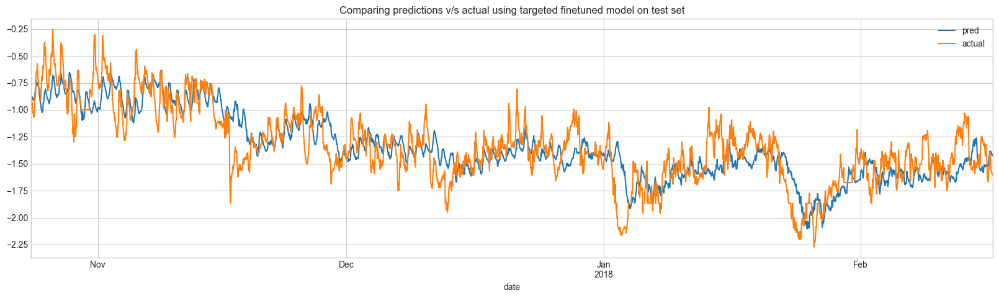

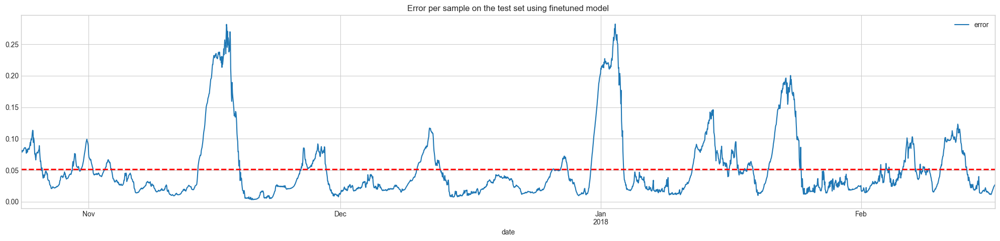

In [32]:
targeted_test_forecast_df = construct_output_df(dset_test, targeted_finetuned_trainer)
tar_test_predictions = compare_forecast(targeted_test_forecast_df, "date", "prediction", "actual", 24)
tar_test_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using targeted finetuned model on test set")

targeted_test_forecast_df["error"] = targeted_test_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax3 = targeted_test_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the test set using finetuned model")
ax3.axhline(y=targeted_test_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {targeted_test_forecast_df['error'].mean():.3f}")




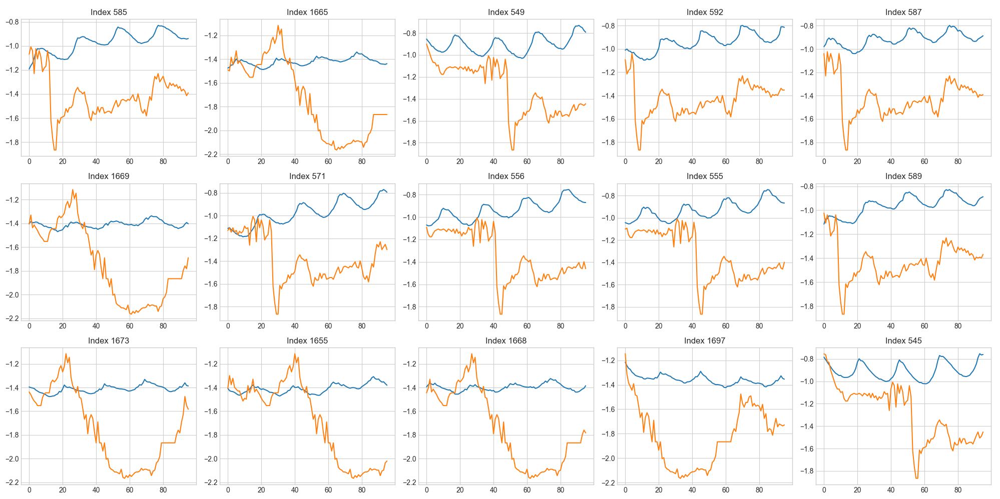

In [162]:
plot_high_error_samples(3, 5, targeted_test_forecast_df, 0.2)

<Axes: title={'center': 'Error per sample on the test set using finetuned and targeted models'}, xlabel='date'>

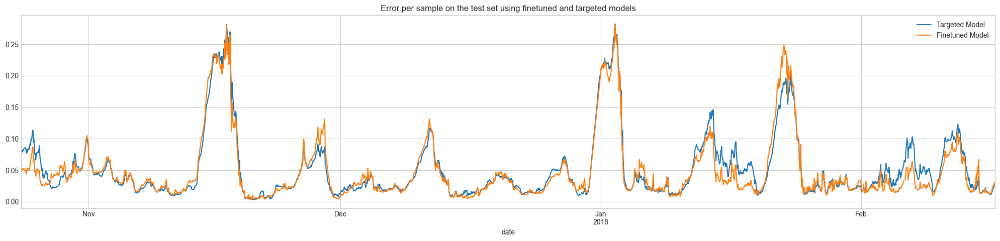

In [33]:
ax4 = targeted_test_forecast_df.plot(
    x="date",
    y="error",
    figsize=(25, 5),
    label="Targeted Model",
    title="Error per sample on the test set using finetuned and targeted models"
)


ft_test_forecast_df.plot(
    x="date",
    y="error",
    ax=ax4,         
    label="Finetuned Model"
)

### Learning shapelets from high error val samples

In [35]:
import sys
sys.path.append("/Users/shivanitomar/Documents/Implementations/ps_pgsm_shapelets/incremental_code")
import utils

In [36]:
mean_to_plot = []
std_to_plot = []
for i in range(len(high_error_val_samples["context"])):
    mean = np.array(high_error_val_samples["context"].iloc[i]).mean()
    std = np.array(high_error_val_samples["context"].iloc[i]).std()
    mean_to_plot.append(mean)          
    std_to_plot.append(std)


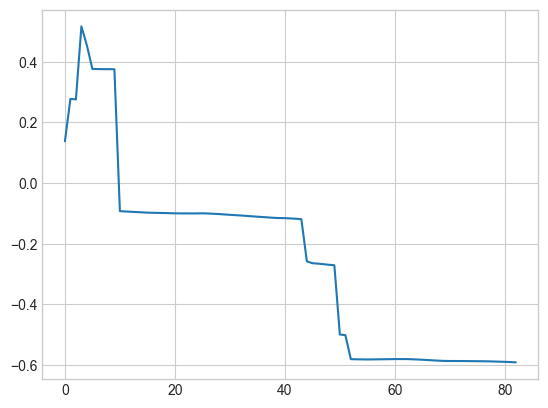

In [37]:
plt.plot(mean_to_plot)

In [436]:
context_array = np.array(high_error_val_samples["context"].tolist())
context_array.shape


(83, 512)

In [551]:
n, p = context_array.shape
r = 0.2
q = int(np.ceil(p * r))
k = 50
S, A, Offsets, F_obj = utils.USIDL_with_alpha_const(context_array, lambda_=0.1, K=k, q=q, c=100, epsilon=1e-5,
                                                    maxIter=2e3, maxInnerIter=5, random_seed=32)
shapelet_dict_v7 = {f'shapelet_{i}': S[i] for i in range(S.shape[0])}

# base_path = f"/Users/shivanitomar/Documents/Implementations/autotune_extension/learned_shapelets/{dataset}[0].pkl"
# with open(base_path, 'wb') as f:
#     pickle.dump(shapelet_dict, f)

# return shapelet_dict

setting random seed to 32 for dictionary initialization
Converged!


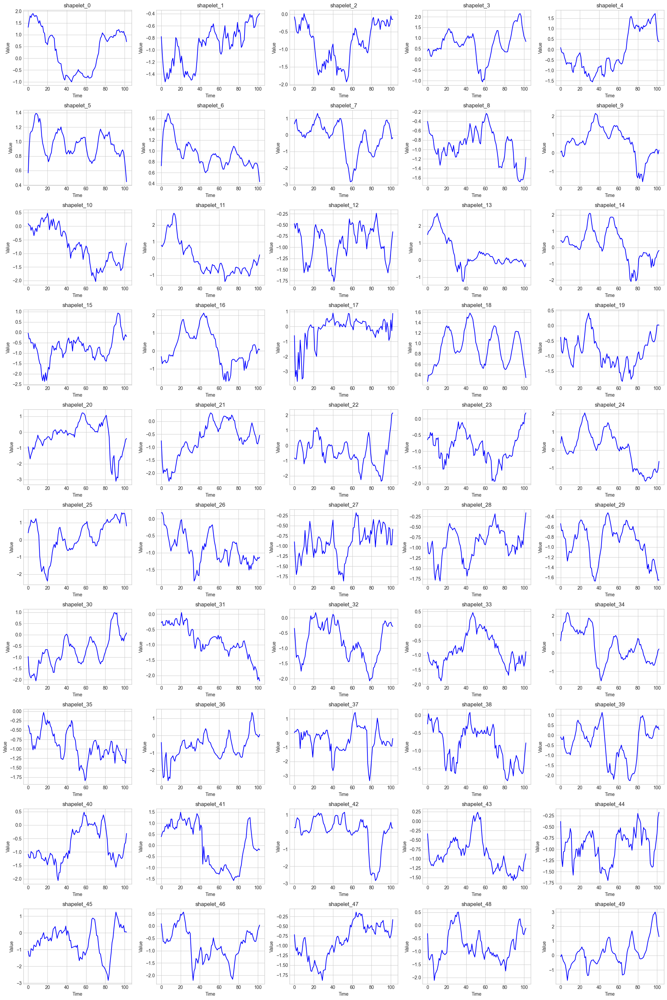

In [552]:
plot_shapelet_dict(shapelet_dict_v7, 5)

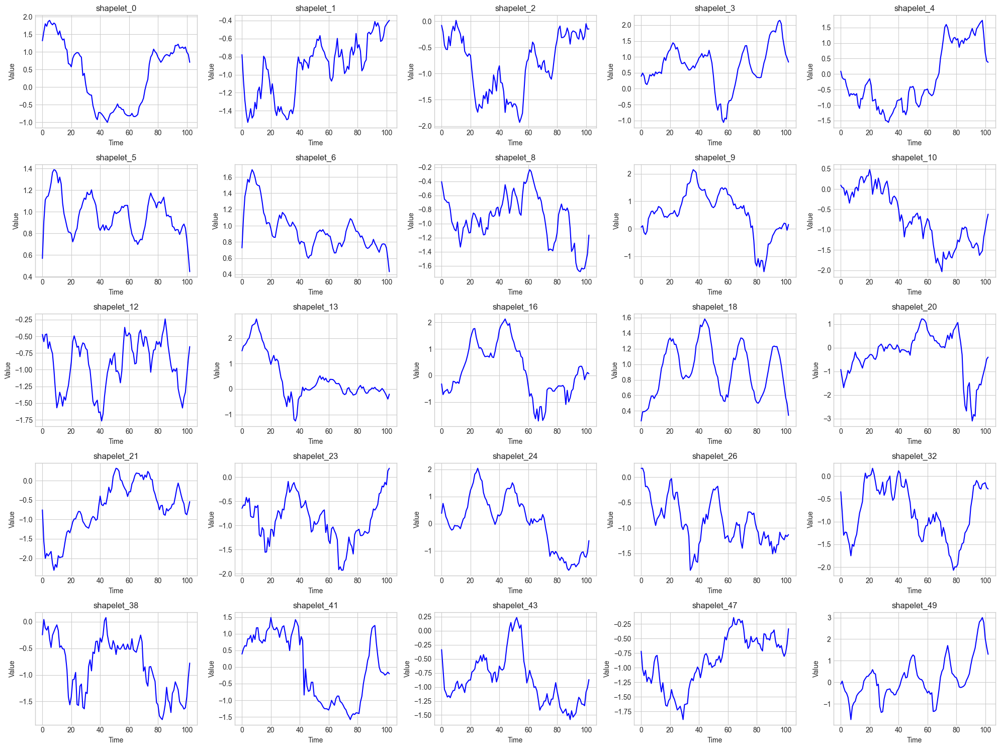

In [575]:
plot_shapelet_dict(select_shapelets_v7, 5)

In [573]:
#rank shapelets based on alpha coeff 
alpha_df = pd.DataFrame(A)
k=25

alpha_sum = alpha_df.sum(axis=0).to_frame().T
topk_shap_idx = alpha_sum.iloc[0].nlargest(k).index
df_top25 = alpha_sum[topk_shap_idx]

select_shapelets_v7 = {}
for key, value in shapelet_dict_v7.items():
    idx = int(key.split("_")[1])
    if idx in topk_shap_idx:
        select_shapelets_v7[key] = value
    

In [43]:
def plot_shapelet_dict(shapelet_dict, cols):
    n_shapelets = len(shapelet_dict)
    rows = math.ceil(n_shapelets / cols)

    fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 3 * rows))
    axs = axs.flatten()

    for i, (shapelet_id, shapelet) in enumerate(shapelet_dict.items()):
        axs[i].plot(shapelet, color='blue')
        axs[i].set_title(f"{shapelet_id}")
        axs[i].set_xlabel("Time")
        axs[i].set_ylabel("Value")

    plt.tight_layout()
    plt.show()



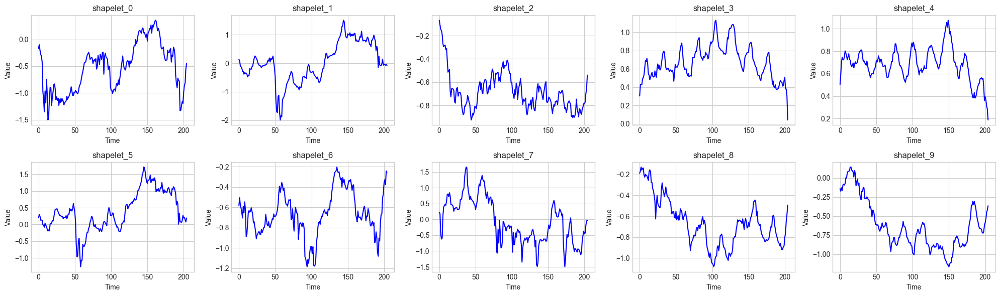

In [453]:
plot_shapelet_dict(shapelet_dict_v6, 5)

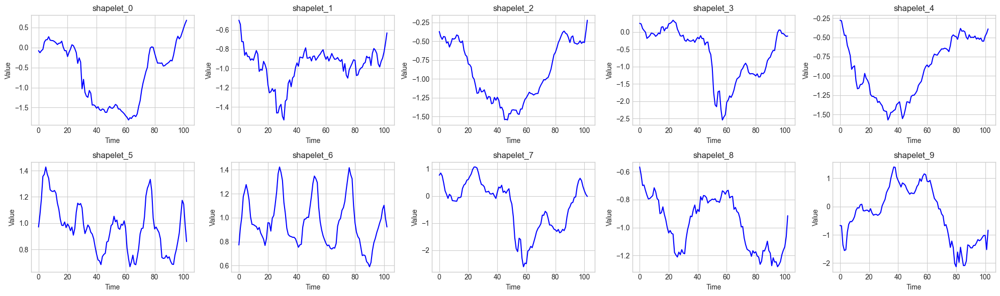

In [452]:
plot_shapelet_dict(shapelet_dict_v5, 5)

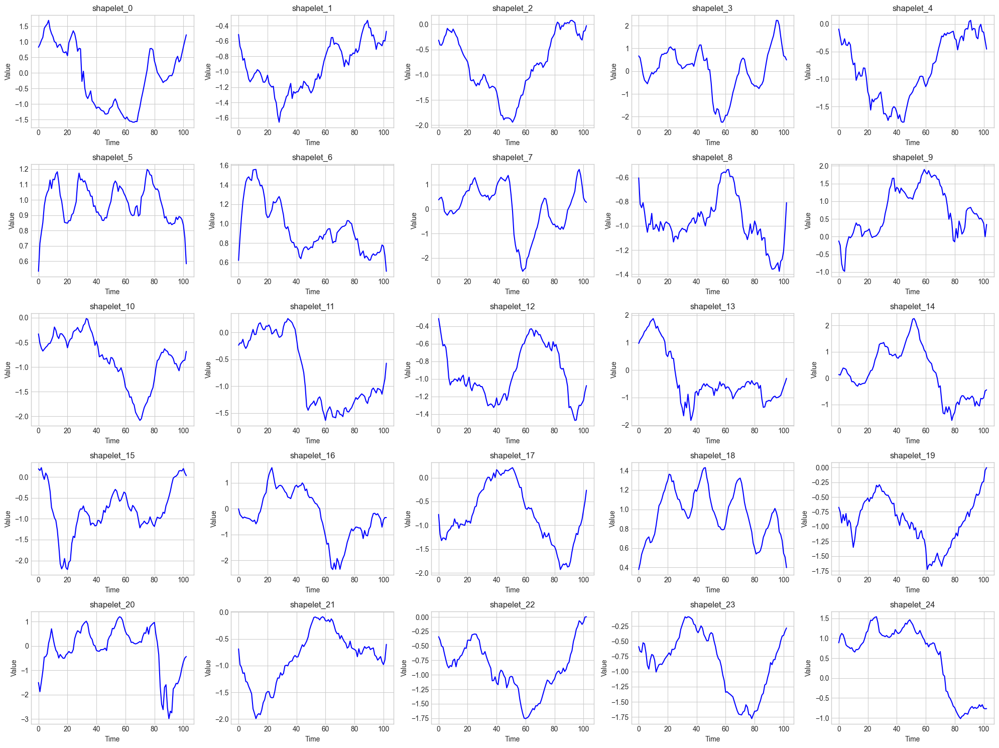

In [306]:
plot_shapelet_dict(shapelet_dict_v3, 5)

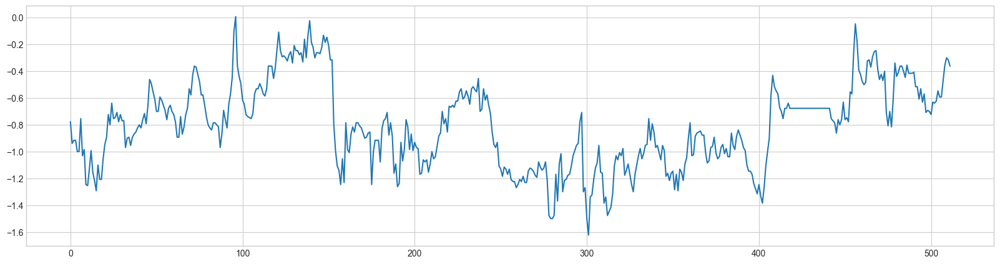

In [307]:
plt.figure(figsize=(20,5))
plt.plot(dset_train_targeted[0]["past_values"])

### Embedding analysis of TTM (zero shot against full fine tuned)

In [47]:
zeroshot_val_model = get_model(
    TTM_MODEL_PATH,
    context_length=CONTEXT_LENGTH,
    prediction_length=PREDICTION_LENGTH,
    freq_prefix_tuning=False,
    freq=None,
    prefer_l1_loss=False,
    prefer_longer_context=True,
    # adding TTM model config
    prediction_channel_indices=tsp.prediction_channel_indices,
    num_input_channels=tsp.num_input_channels,
)
temp_dir = tempfile.mkdtemp()
# zeroshot_trainer
zeroshot_trainer = Trainer(
    model=zeroshot_val_model,
    args=TrainingArguments(
        output_dir=temp_dir,
        per_device_eval_batch_size=64,
        seed=SEED,
        report_to="none",
    ),
)

# get predictions

predictions_dict = zeroshot_trainer.predict(dset_val)
print("zeroshot output returned from predict() function", predictions_dict[2])

predictions_np = predictions_dict.predictions[0]

print("shape of predictions array", predictions_np.shape)

# get backbone embeddings (if needed for further analysis)

zs_backbone_embedding = predictions_dict.predictions[1]
zs_decoder_embedding = predictions_dict.predictions[2]

print("Backbone embedding shape", zs_backbone_embedding.shape)
print("Decoder embedding shape", zs_decoder_embedding.shape)

zs_val_df = construct_output_df(dset_val, zeroshot_trainer)
zs_val_df["error"] = zs_val_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)

INFO:p-41972:t-8466403200:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2
INFO:p-41972:t-8466403200:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-41972:t-8466403200:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96
/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


zeroshot output returned from predict() function {'test_loss': 0.10167164355516434, 'test_model_preparation_time': 0.0012, 'test_runtime': 1.1965, 'test_samples_per_second': 2327.577, 'test_steps_per_second': 36.773}
shape of predictions array (2785, 96, 1)
Backbone embedding shape (2785, 1, 8, 192)
Decoder embedding shape (2785, 1, 8, 128)


In [48]:
targeted_tuned_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/v5_output/checkpoint-65")
temp_dir = tempfile.mkdtemp()

targeted_finetuned_trainer = Trainer(
        model=targeted_tuned_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

targeted_predictions_dict = targeted_finetuned_trainer.predict(dset_val)
targeted_backbone_embedding = targeted_predictions_dict.predictions[1]
targeted_decoder_embedding = targeted_predictions_dict.predictions[2]

print("Backbone embedding shape", targeted_backbone_embedding.shape)
print("Decoder embedding shape", targeted_decoder_embedding.shape)

targeted_val_df = construct_output_df(dset_val, targeted_finetuned_trainer)

targeted_val_df["error"] = targeted_val_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)

/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Backbone embedding shape (2785, 1, 8, 192)
Decoder embedding shape (2785, 1, 8, 128)


In [146]:
fft_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/do_0.4_output/checkpoint-126")

temp_dir = tempfile.mkdtemp()

fft_trainer = Trainer(
        model=fft_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

fft_predictions_dict = fft_trainer.predict(dset_val)
fft_backbone_embedding = fft_predictions_dict.predictions[1]
fft_decoder_embedding = fft_predictions_dict.predictions[2]

test_fft_predictions_dict = fft_trainer.predict(dset_test)
test_fft_backbone_embedding = test_fft_predictions_dict.predictions[1]
test_fft_decoder_embedding = test_fft_predictions_dict.predictions[2]

print("Backbone embedding shape", fft_backbone_embedding.shape)
print("Decoder embedding shape", fft_decoder_embedding.shape)

fft_val_df = construct_output_df(dset_val, fft_trainer)
fft_val_df["error"] = fft_val_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)

fft_test_df = construct_output_df(dset_test, fft_trainer)
fft_test_df["error"] = fft_test_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)

/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Backbone embedding shape (2785, 1, 8, 192)
Decoder embedding shape (2785, 1, 8, 128)


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


### t-SNE plot on the backbone embeddings

In [ ]:
import numpy as np
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


embeddings = targeted_backbone_embedding
# Flatten to 2D
ft_embeddings_flat = embeddings.reshape(embeddings.shape[0], -1)


tsne = TSNE(n_components=2, perplexity=50, 
            learning_rate=300, max_iter=2000, random_state=33)
ft_embeddings_2d = tsne.fit_transform(ft_embeddings_flat)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(ft_embeddings_2d[:, 0], ft_embeddings_2d[:, 1], alpha=0.6) #c=targeted_val_df["error"],cmap='bwr'
# plt.colorbar(scatter)
plt.title('t-SNE Visualization of TTM backbone embeddings')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.tight_layout()
plt.show()

In [57]:
def pca_plot_embeddings(embeddings, error_df, model_type="zeroshot", layer_type="backbone"):
    embeddings_flat = embeddings.reshape(embeddings.shape[0], -1)
    pca_df = pd.DataFrame(embeddings_flat,  columns=[f"dim_{i+1}" for i in range(embeddings_flat.shape[1])])
    pca_df.columns
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(pca_df)
    print(pca_df.columns.shape)

    pca_df['pca1'] = pca_result[:,0]
    pca_df['pca2'] = pca_result[:,1] 
    # pca_df['pca3'] = pca_result[:,2]
    pca_df['error'] = error_df['error']

    print('Explained variation for first two principal components : {}'.format(pca.explained_variance_ratio_))

    plt.figure(figsize=(10, 8))
    plt.scatter(
        pca_df["pca1"], 
        pca_df["pca2"], 
        c=pca_df["error"],   
        cmap="bwr", 
        alpha=0.7
    )
    plt.colorbar(label="MSE per sample")
    plt.xlabel("pca1")
    plt.ylabel("pca2")
    plt.title(f"{model_type} model - {layer_type} embeddings PCA")

(1024,)
Explained variation for first two principal components : [0.32811835 0.06931192]


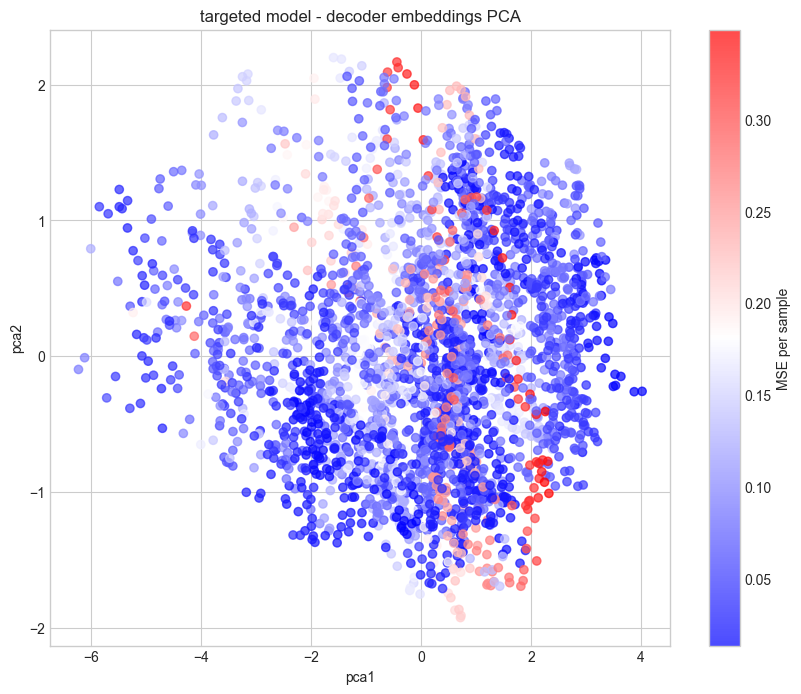

In [58]:
pca_plot_embeddings(targeted_decoder_embedding, targeted_val_df, model_type="targeted", layer_type="decoder")

(1024,)
Explained variation for first two principal components : [0.30124584 0.07215775]


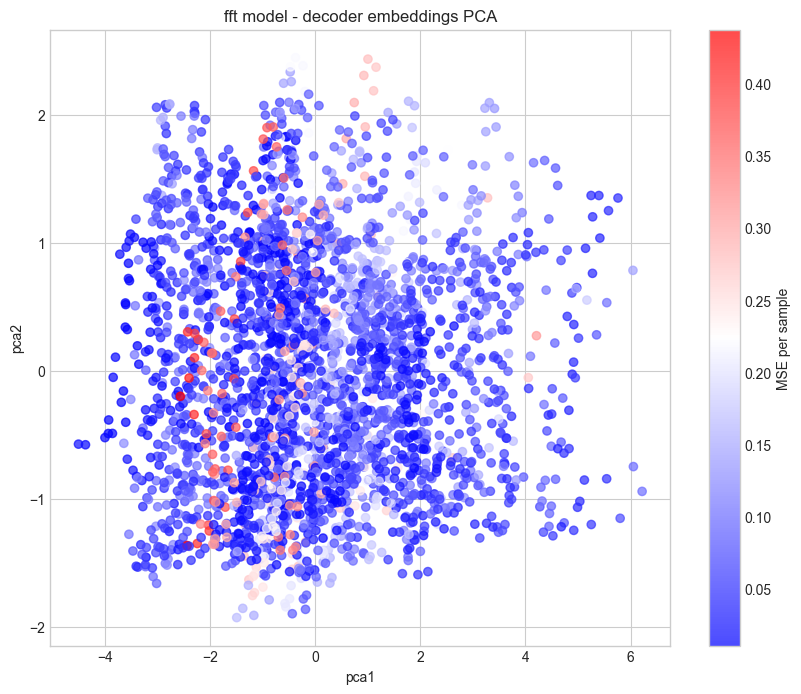

In [59]:
pca_plot_embeddings(fft_decoder_embedding, fft_val_df, model_type="fft", layer_type="decoder" )

(1024,)
Explained variation for first two principal components : [0.40701    0.05530171]


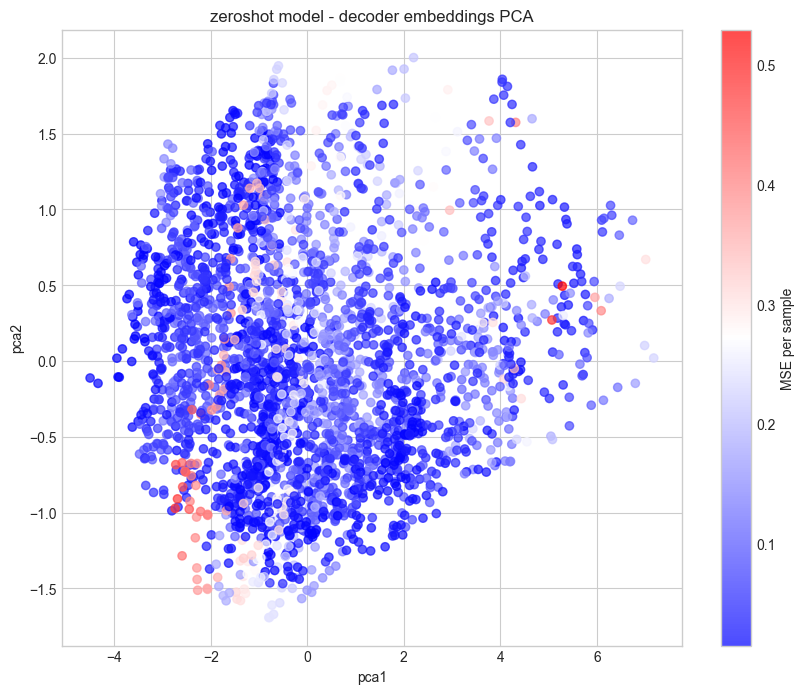

In [164]:
pca_plot_embeddings(zs_decoder_embedding, zs_val_df, model_type="zeroshot", layer_type="decoder")

(1024,)
Explained variation for first two principal components : [0.32593513 0.07386356]


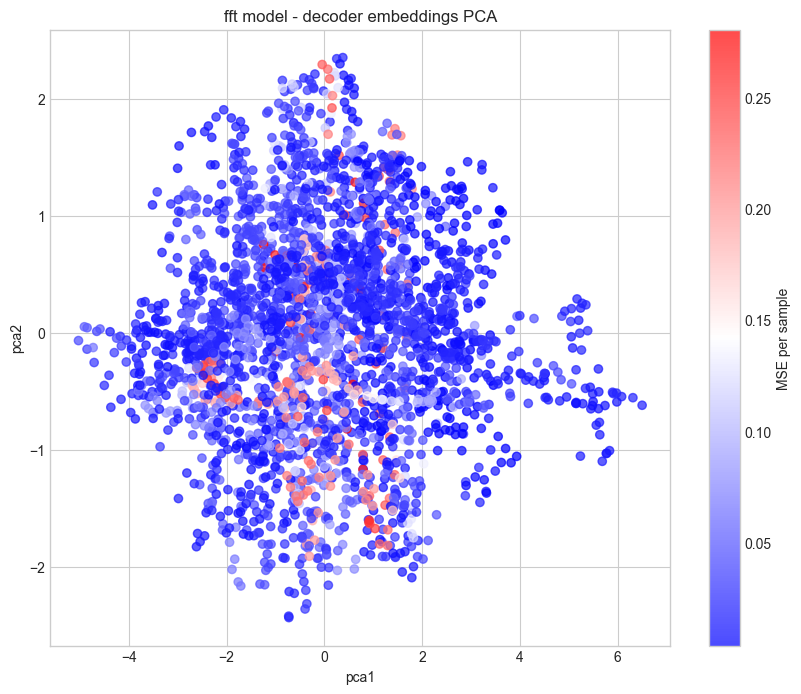

In [147]:
pca_plot_embeddings(test_fft_decoder_embedding, fft_test_df, model_type="fft", layer_type="decoder" )

(1026,)
Explained variation for first two principal components : [0.31063864 0.0725766 ]


Text(0.5, 1.0, ' FFT model - combined - test and val decoder embeddings PCA')

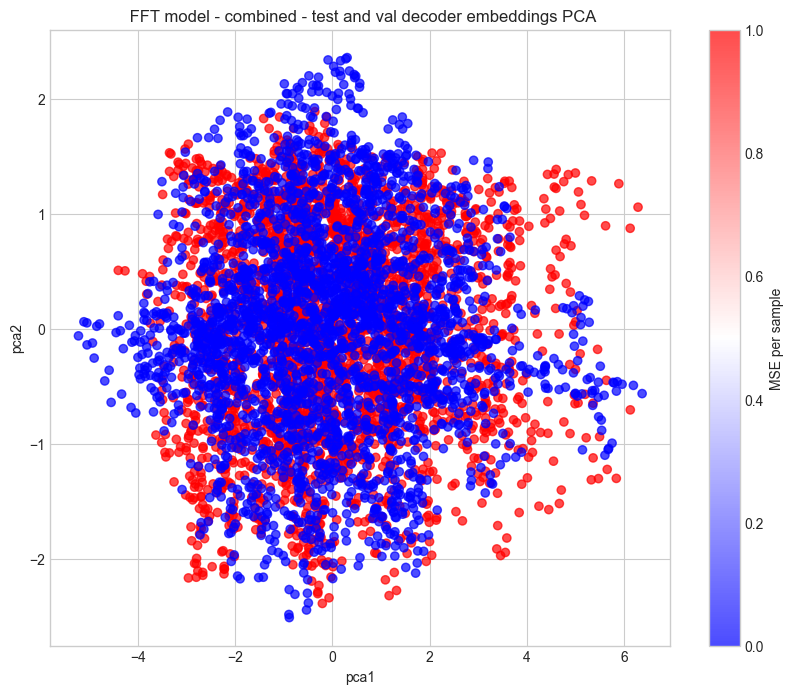

In [162]:
# fitting PCA with both val and test embeddings
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

le = LabelEncoder()

combined_embeddings = np.vstack((fft_decoder_embedding, test_fft_decoder_embedding))
combined_embeddings.shape

comb_embeddings_flat = combined_embeddings.reshape(combined_embeddings.shape[0], -1)

val_labels = ['validation'] * len(fft_decoder_embedding)
test_labels = ['test'] * len(test_fft_decoder_embedding)
combined_labels = np.array(val_labels + test_labels)


pca_df = pd.DataFrame(comb_embeddings_flat,  columns=[f"dim_{i+1}" for i in range(comb_embeddings_flat.shape[1])])
pca_df['label'] = combined_labels
pca_df['label_encoded'] = le.fit_transform(pca_df['label'])
pca_df.columns
pca = PCA(n_components=2)
pca_result = pca.fit_transform(pca_df.drop(columns=['label', 'label_encoded']))
print(pca_df.columns.shape)

pca_df['pca1'] = pca_result[:,0]
pca_df['pca2'] = pca_result[:,1] 
# pca_df['pca3'] = pca_result[:,2]
# pca_df['error'] = error_df['error']

print('Explained variation for first two principal components : {}'.format(pca.explained_variance_ratio_))

plt.figure(figsize=(10, 8))
plt.scatter(
    pca_df["pca1"], 
    pca_df["pca2"], 
    c=pca_df["label_encoded"],
    # c=pca_df["error"],   
    cmap="bwr", 
    alpha=0.7
)
plt.colorbar(label="MSE per sample")
plt.xlabel("pca1")
plt.ylabel("pca2")
plt.title(" FFT model - combined - test and val decoder embeddings PCA")

(1536,)
Explained variation for first two principal components : [0.08815849 0.08656366]


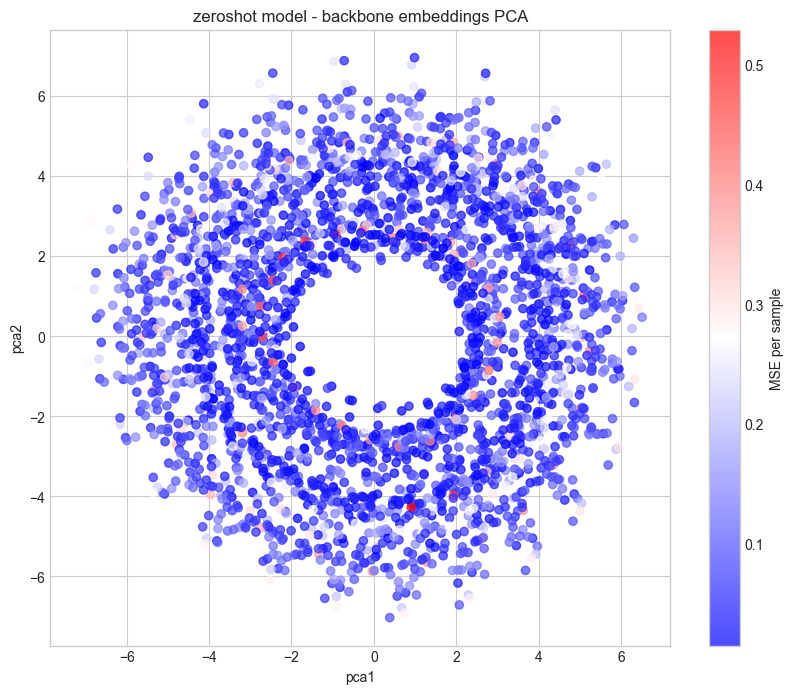

In [62]:
pca_plot_embeddings(zs_backbone_embedding, error_df=zs_val_df, model_type="zeroshot", layer_type="backbone")

(1536,)
Explained variation for first two principal components : [0.0881586  0.08656355]


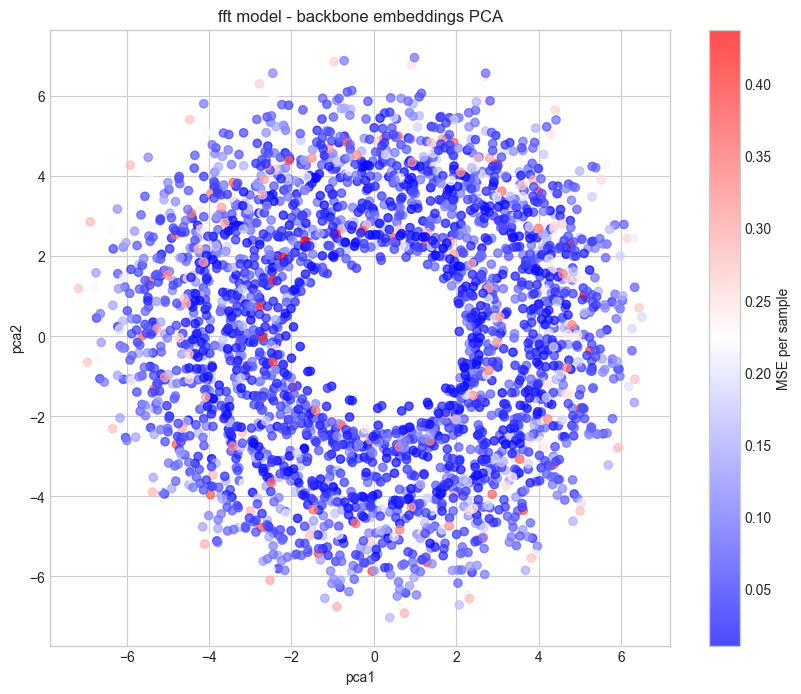

In [63]:
pca_plot_embeddings(fft_backbone_embedding, error_df=fft_val_df, model_type="fft", layer_type="backbone")

In [ ]:
# closest training samples to shapelets using FastDTW learned from validation split 
from fastdtw import fastdtw

train_set = []
timestamps = []

for i in range(len(dset_train)):
    sample = dset_train[i]['past_values']
    train_set.append(sample)
    timestamps.append(dset_train[i]['timestamp']) 

train_context = torch.stack(train_set).squeeze(-1).numpy()
train_context_reshaped = np.expand_dims(train_context, axis=1)
columns = [f"timepoint_{i}" for i in range(train_context.shape[1])]
train_context_df = pd.DataFrame(train_context, columns=columns)
train_context_df["timestamp"] = timestamps
train_context_df.set_index("timestamp", inplace=True)

distances = np.zeros((len(dset_train), len(shapelet_dict_v3)))
for i, sample in enumerate(train_context_df.values):
    # print(sample)
    for j, shapelet in enumerate(shapelet_dict_v3.values()):
        # print(shapelet.shape)
        # from sktime.distances import dtw_distance
        dist = fastdtw(sample, shapelet)[0]
        print(dist)
        # dist = dtw_distance(sample, shapelet)
        distances[i, j] = dist

In [576]:
# closest training samples to shapelets using ED learned from validation split 
def z_norm(x):
    return (x - np.mean(x)) / np.std(x)

def shapelet_distance(segment, series):
    seg = z_norm(segment)
    series = z_norm(series)
    seg_len = len(seg)
    return min(np.linalg.norm(seg - series[i:i+seg_len]) for i in range(len(series)-seg_len+1))

train_set = []
timestamps = []

for i in range(len(dset_train)):
    sample = dset_train[i]['past_values']
    train_set.append(sample)
    timestamps.append(dset_train[i]['timestamp']) 

train_context = torch.stack(train_set).squeeze(-1).numpy()
train_context_reshaped = np.expand_dims(train_context, axis=1)
columns = [f"timepoint_{i}" for i in range(train_context.shape[1])]
train_context_df = pd.DataFrame(train_context, columns=columns)
train_context_df["timestamp"] = timestamps
train_context_df.set_index("timestamp", inplace=True)

target_train_ed = np.zeros((len(dset_train),len(select_shapelets_v7)))

# save all the test distances with shapelets in an array
for i in range(len(train_context_df)):
    for j, shapelet in enumerate(select_shapelets_v7.values()):
        series = np.array(dset_train[i]["past_values"].squeeze(1))
        dist = shapelet_distance(shapelet, series)
        target_train_ed[i, j] = dist


In [577]:
from torch.utils.data import Subset

fraction = 0.1
targeted_samples = int(fraction * len(dset_train))

min_dists = target_train_ed.min(axis=1)
sorted_idx = np.argsort(min_dists)
selected_samples = sorted_idx[:targeted_samples]

dset_train_targeted = Subset(dset_train, selected_samples)


In [578]:
len(dset_train_targeted)

803

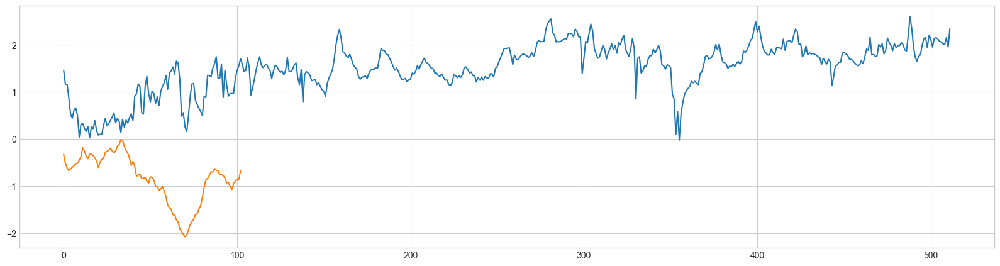

In [141]:
plt.figure(figsize=(20,5))
plt.plot(train_context_df.iloc[0].values)
plt.plot(shapelet_dict_v3["shapelet_10"])

In [550]:
len(dset_train_targeted)

803

In [603]:
# targeted training of model 

def targeted_finetune_eval(
    dataset_name,
    batch_size,
    learning_rate=None,
    context_length=512,
    forecast_length=96,
    fewshot_percent=100,
    freeze_backbone=True,
    num_epochs=10,
    save_dir=OUT_DIR,
    loss="mse",
    quantile=0.5,
):
    out_dir = os.path.join(save_dir, dataset_name)

    print("-" * 20, f"Running few-shot {fewshot_percent}%", "-" * 20)

    # Data prep: Get dataset
    

    # tsp = TimeSeriesPreprocessor(
    #     **column_specifiers,
    #     context_length=context_length,
    #     prediction_length=forecast_length,
    #     scaling=True,
    #     encode_categorical=False,
    #     scaler_type="standard",
    # )
    # print("+" * 20, "TSP values", "+" * 20)
    # print(tsp.prediction_channel_indices)
    # print(tsp.exogenous_channel_indices)
    # print(tsp.context_length)
    # print(tsp.prediction_length)
    # print(tsp.num_input_channels)
    # print(tsp.scaler_type)




    # change head dropout to 0.7 for ett datasets
    if "ett" in dataset_name:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            prediction_channel_indices=tsp.prediction_channel_indices,
            num_input_channels=tsp.num_input_channels,

            head_dropout=0.8,
            loss=loss,
            quantile=quantile,
        )
    else:
        finetune_forecast_model = get_model(
            TTM_MODEL_PATH,
            context_length=context_length,
            prediction_length=forecast_length,
            freq_prefix_tuning=False,
            freq=None,
            prefer_l1_loss=False,
            prefer_longer_context=True,
            # Can also provide TTM Config args
            loss=loss,
            quantile=quantile,
        )

    # dset_train, dset_val, dset_test = get_datasets(
    #     tsp,
    #     data,
    #     split_config,
    #     fewshot_fraction=fewshot_percent / 100,
    #     fewshot_location="first",
    #     use_frequency_token=finetune_forecast_model.config.resolution_prefix_tuning,
        
    # )
    print("after get_datasets ------", len(dset_train_targeted))

    if freeze_backbone:
        print(
            "Number of params before freezing backbone",
            count_parameters(finetune_forecast_model),
        )

        # Freeze the backbone of the model
        for param in finetune_forecast_model.backbone.parameters():
            param.requires_grad = False

        # Count params
        print(
            "Number of params after freezing the backbone",
            count_parameters(finetune_forecast_model),
        )

    # Find optimal learning rate
    # Use with caution: Set it manually if the suggested learning rate is not suitable
    if learning_rate is None:
        learning_rate, finetune_forecast_model = optimal_lr_finder(
            finetune_forecast_model,
            dset_train,
            batch_size=batch_size,
        )
        print("OPTIMAL SUGGESTED LEARNING RATE =", learning_rate)

    print(f"Using learning rate = {learning_rate}")
    finetune_forecast_args = TrainingArguments(
        output_dir=os.path.join(out_dir, "v15_shap_LR0.002_DO0.8"),
        overwrite_output_dir=True,
        learning_rate=learning_rate,
        num_train_epochs=num_epochs,
        do_eval=True,
        eval_strategy="epoch",
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        dataloader_num_workers=8,
        report_to="none",
        save_strategy="epoch",
        logging_strategy="epoch",
        save_total_limit=1,
        logging_dir=os.path.join(out_dir, "logs"),  # Make sure to specify a logging directory
        load_best_model_at_end=True,  # Load the best model when training ends
        metric_for_best_model="eval_loss",  # Metric to monitor for early stopping
        greater_is_better=False,  # For loss
        seed=SEED,
    )

    # Create the early stopping callback
    early_stopping_callback = EarlyStoppingCallback(
        early_stopping_patience=5,  # Number of epochs with no improvement after which to stop
        early_stopping_threshold=1e-5,  # Minimum improvement required to consider as improvement
    )
    tracking_callback = TrackingCallback()

    # Optimizer and scheduler
    optimizer = AdamW(finetune_forecast_model.parameters(), lr=learning_rate)
    scheduler = OneCycleLR(
        optimizer,
        learning_rate,
        epochs=num_epochs,
        steps_per_epoch=math.ceil(len(dset_train_targeted) / (batch_size)),
    )
    print("length of training set is", len(dset_train_targeted))
    
    finetune_forecast_trainer = Trainer(
        model=finetune_forecast_model,
        args=finetune_forecast_args,
        train_dataset=dset_train_targeted,
        eval_dataset=dset_val,
        callbacks=[early_stopping_callback, tracking_callback],
        optimizers=(optimizer, scheduler),
    )
    finetune_forecast_trainer.remove_callback(INTEGRATION_TO_CALLBACK["codecarbon"])

    # Fine tune
    finetune_forecast_trainer.train()

    # Evaluation
    print("+" * 20, f"Test MSE after few-shot {fewshot_percent}% fine-tuning", "+" * 20)

    finetune_forecast_trainer.model.loss = "mse"  # fixing metric to mse for evaluation

    fewshot_output = finetune_forecast_trainer.evaluate(dset_test)
    print(fewshot_output)
    print("+" * 60)

    # get predictions

    predictions_dict = finetune_forecast_trainer.predict(dset_test)
    print("prediction metrics on test set", predictions_dict[2])

    predictions_np = predictions_dict.predictions[0]

    print(predictions_np.shape)

    # get backbone embeddings (if needed for further analysis)

    backbone_embedding = predictions_dict.predictions[1]

    print(backbone_embedding.shape)

    # plot
    plot_predictions(
        model=finetune_forecast_trainer.model,
        dset=dset_test,
        plot_dir=os.path.join(OUT_DIR, dataset_name),
        plot_prefix="test_fewshot",
        indices=[685, 118, 902],
        channel=0,
    )
    return predictions_dict

INFO:p-41972:t-8466403200:get_model.py:get_model:Loading model from: ibm-granite/granite-timeseries-ttm-r2


-------------------- Running few-shot 100% --------------------


INFO:p-41972:t-8466403200:get_model.py:get_model:Model loaded successfully from ibm-granite/granite-timeseries-ttm-r2, revision = main.
INFO:p-41972:t-8466403200:get_model.py:get_model:[TTM] context_length = 512, prediction_length = 96


after get_datasets ------ 803
Number of params before freezing backbone 805280
Number of params after freezing the backbone 289696
Using learning rate = 0.002
length of training set is 803


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss
1,1.924200,0.101853
2,1.595700,0.103575
3,0.959200,0.105490
4,0.718400,0.103884
5,0.461600,0.100042
6,0.432100,0.105531
7,0.282900,0.112561
8,0.268100,0.117463
9,0.200800,0.124005
10,0.184800,0.130315


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not suppo

[TrackingCallback] Mean Epoch Time = 58.5581132888794 seconds, Total Train Time = 1171.1935489177704
++++++++++++++++++++ Test MSE after few-shot 100% fine-tuning ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


{'eval_loss': 0.05242759361863136, 'eval_runtime': 58.8655, 'eval_samples_per_second': 47.311, 'eval_steps_per_second': 0.747, 'epoch': 10.0}
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
prediction metrics on test set {'test_loss': 0.05242759361863136, 'test_runtime': 60.949, 'test_samples_per_second': 45.694, 'test_steps_per_second': 0.722}
(2785, 96, 1)
(2785, 1, 8, 192)


PredictionOutput(predictions=(array([[[-0.87234133],
        [-0.91885024],
        [-0.94169533],
        ...,
        [-0.9735196 ],
        [-1.0156344 ],
        [-1.0092645 ]],

       [[-0.851189  ],
        [-0.9079672 ],
        [-0.9364495 ],
        ...,
        [-0.97492903],
        [-1.0142734 ],
        [-1.007895  ]],

       [[-0.8509172 ],
        [-0.9132763 ],
        [-0.94492525],
        ...,
        [-0.9676332 ],
        [-1.0117958 ],
        [-1.0073061 ]],

       ...,

       [[-1.4071172 ],
        [-1.4396288 ],
        [-1.4373672 ],
        ...,
        [-1.5099474 ],
        [-1.5267153 ],
        [-1.5122617 ]],

       [[-1.4278237 ],
        [-1.4479519 ],
        [-1.4454379 ],
        ...,
        [-1.5047272 ],
        [-1.5161768 ],
        [-1.5081227 ]],

       [[-1.4129823 ],
        [-1.4416053 ],
        [-1.441566  ],
        ...,
        [-1.490513  ],
        [-1.5069467 ],
        [-1.5075858 ]]], dtype=float32), array([[[[ 2.59347167e-

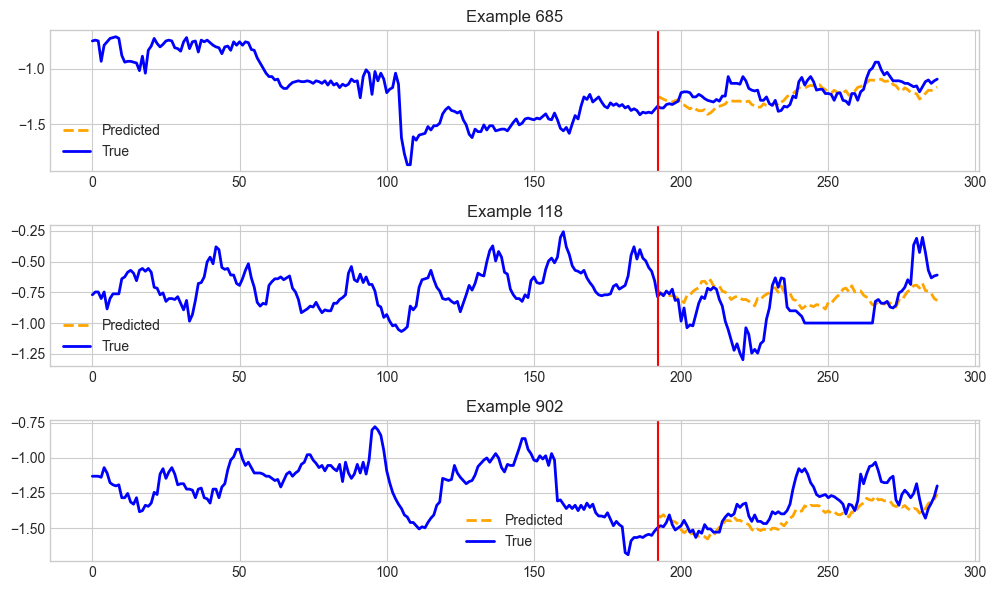

In [604]:
targeted_finetune_eval(
    dataset_name=TARGET_DATASET,
    context_length=CONTEXT_LENGTH,
    forecast_length=PREDICTION_LENGTH,
    batch_size=64,
    fewshot_percent=100,
    learning_rate=0.002,
    num_epochs=20,
)

In [605]:
targeted_shap_model = TinyTimeMixerForPrediction.from_pretrained("/Users/shivanitomar/Documents/Implementations/granite-tsfm/notebooks/hfdemo/ttm_finetuned_models/etth1/v15_shap_LR0.002_DO0.8/checkpoint-65")
temp_dir = tempfile.mkdtemp()

targeted_shap_trainer = Trainer(
        model=targeted_shap_model,
        args=TrainingArguments(
            output_dir=temp_dir,
            per_device_eval_batch_size=64,
            seed=SEED,
            report_to="none",
        ),
    )

print("+" * 20, "Test MSE fine-tuned", "+" * 20)
targeted_output = targeted_shap_trainer.evaluate(dset_test)
print("targeted shap performance on test set", targeted_output)

++++++++++++++++++++ Test MSE fine-tuned ++++++++++++++++++++


/opt/homebrew/Caskroom/miniforge/base/envs/ttm_env_new3.10/lib/python3.10/site-packages/torch/utils/data/dataloader.py:684: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


targeted shap performance on test set {'eval_loss': 0.05242759361863136, 'eval_model_preparation_time': 0.0011, 'eval_runtime': 0.7029, 'eval_samples_per_second': 3962.422, 'eval_steps_per_second': 62.602}


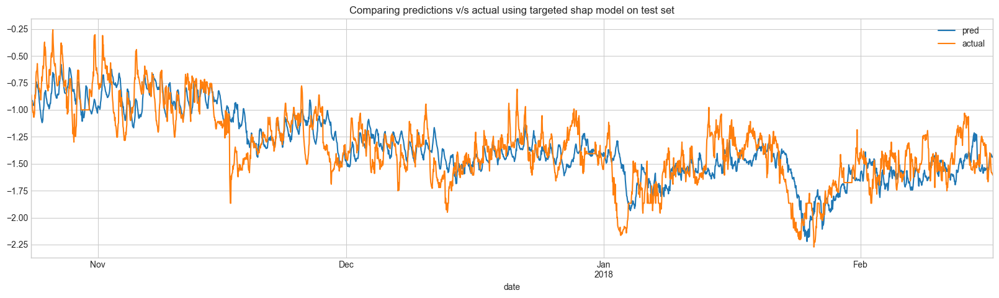

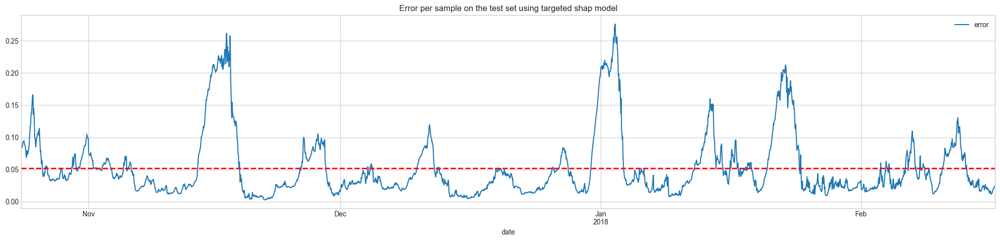

In [606]:
targeted_shap_forecast_df = construct_output_df(dset_test, targeted_shap_trainer)
tar_shap_predictions = compare_forecast(targeted_shap_forecast_df, "date", "prediction", "actual", 24)
tar_shap_predictions.plot(x="date", y=["pred", "actual"], figsize=(20,5), title="Comparing predictions v/s actual using targeted shap model on test set")

targeted_shap_forecast_df["error"] = targeted_shap_forecast_df.apply(lambda row: mean_squared_error([row["prediction"]], [row["actual"]]), axis=1)
ax6 = targeted_shap_forecast_df.plot(x="date", y=["error"], figsize=(25, 5), title="Error per sample on the test set using targeted shap model")
ax6.axhline(y=targeted_shap_forecast_df['error'].mean(), color="red", linestyle="--", linewidth=2, label=f"Avg Error = {targeted_shap_forecast_df['error'].mean():.3f}")

<Axes: title={'center': 'Error per sample on the test set using finetuned and targeted(shap) models'}, xlabel='date'>

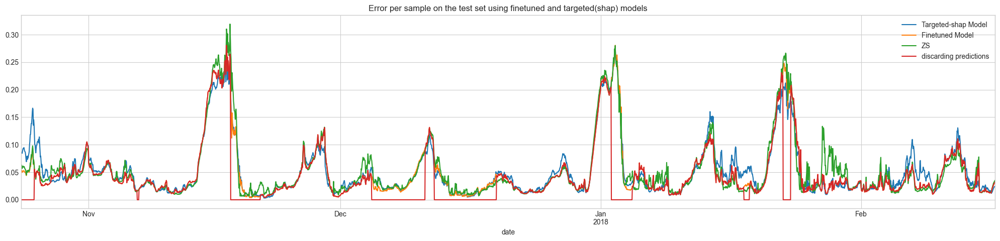

In [684]:
ax8 = targeted_shap_forecast_df.plot(
    x="date",
    y="error",
    figsize=(25, 5),
    label="Targeted-shap Model",
    title="Error per sample on the test set using finetuned and targeted(shap) models"
)


ft_test_forecast_df.plot(
    x="date",
    y="error",
    ax=ax8,         
    label="Finetuned Model"
)

zs_test_forecast_df.plot(
    x="date",
    y="error",
    ax=ax8,
    label="ZS"
)

discard_df.plot(
    x="date",
    y="error",
    ax=ax8,
    label="discarding predictions"




)


### Next Steps 
- Check similarity with test samples and discard samples based on average similarity on validation set.
- Cross check if the predictions for discarded test samples were greater than average zero shot error.

In [681]:
drop_limit = int(0.2 * len(dset_test))
print("Allowed number of samples to discard predictions", drop_limit)

Allowed number of samples to discard predictions 557


### Using FastDTW metric

In [ ]:
# Comparing shapelets to test set samples based on distance similarity to discard predictions 

test_distances = np.zeros((len(dset_test),len(shapelet_dict_v3)))

# save all the test distances with shapelets in an array
for i in range(len(dset_test)):
    for j, shapelet in enumerate(shapelet_dict_v3.values()):
        dist = fastdtw(dset_test[i]["past_values"], shapelet)[0]
        test_distances[i, j] = dist      


Allowed number of samples to discard predictions 278


### Using Euclidean Distance metric

In [613]:
len(select_shapelets_v7)

25

In [615]:
def z_norm(x):
    return (x - np.mean(x)) / np.std(x)

def shapelet_distance(segment, series):
    seg = z_norm(segment)
    series = z_norm(series)
    seg_len = len(seg)
    return min(np.linalg.norm(seg - series[i:i+seg_len]) for i in range(len(series)-seg_len+1))


test_distances_ed = np.zeros((len(dset_test),len(select_shapelets_v7)))

# save all the test distances with shapelets in an array
for i in range(len(dset_test)):
    for j, shapelet in enumerate(select_shapelets_v7.values()):
        series = np.array(dset_test[i]["past_values"].squeeze(1))
        dist = shapelet_distance(shapelet, series)
        test_distances_ed[i, j] = dist

In [680]:
pd.DataFrame(test_distances_ed)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,8.075488,6.392519,7.564147,8.633945,6.571411,10.598564,9.842721,11.201509,11.583139,7.789892,...,7.855781,10.256894,10.568591,11.852787,10.709590,11.931828,9.319002,11.703117,5.346555,7.520029
1,8.192335,6.393968,7.561640,8.631906,6.571111,10.603629,9.841202,11.203353,11.578216,7.793400,...,7.853090,10.257799,10.566380,11.848072,10.708770,11.927134,9.321969,11.698302,5.348859,7.521267
2,8.278801,6.393506,7.563122,8.633298,6.571638,10.601570,9.843347,11.202838,11.581537,7.793726,...,7.854479,10.257591,10.569937,11.851301,10.709559,11.930374,9.322461,11.701567,5.347813,7.520456
3,8.278214,6.394500,7.561474,8.631976,6.571476,10.604993,9.842464,11.204107,11.578336,7.796260,...,7.852692,10.258220,10.566252,11.848239,10.709049,11.927330,9.324625,11.698438,5.349363,7.521266
4,8.276799,6.395439,7.559571,8.710217,6.571102,10.608443,9.840759,11.205262,11.574403,7.797875,...,7.850737,10.258770,10.561859,11.844451,10.708294,11.923548,9.325894,11.694586,5.350990,7.522253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780,6.363966,8.066318,6.643070,7.632870,7.467582,9.801355,8.708901,8.742002,7.682683,8.942624,...,7.027504,8.607794,8.229091,9.740100,7.450758,8.309488,7.208863,7.967038,7.983693,8.123312
2781,6.354237,8.093980,6.633902,7.634158,7.473728,9.788200,8.706996,8.753220,7.692328,8.926023,...,7.030581,8.614411,8.209411,9.738791,7.450833,8.319522,7.206261,7.975952,7.982376,8.110832
2782,6.347235,8.118874,6.627174,7.636064,7.480483,9.775464,8.705137,8.763225,7.701761,8.910106,...,7.034702,8.620353,8.191154,9.736671,7.451780,8.328801,7.204993,7.984497,7.981598,8.099904
2783,6.340476,8.143846,6.620704,7.638224,7.487386,9.763232,8.703645,8.773481,7.711372,8.894748,...,7.039001,8.626579,8.173427,9.735002,7.452978,8.338306,7.203978,7.993251,7.981129,8.089355


In [682]:
import warnings

min_dists = test_distances_ed.min(axis=1)
sorted_idx = np.argsort(min_dists)
samples_to_drop = sorted_idx[:drop_limit]

# models_to_use = ["v"]

total_error = []

for i in range(len(dset_test)):
    if i in samples_to_drop:
        # print("Discarding the sample as due to high similarity with one of the shapelets")
        dis = 0
        total_error.append(dis)

    else:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            preds_dict = localfinetuned_trainer.predict([dset_test[i]])
            
            preds = preds_dict.predictions[0]
            preds = preds.squeeze(0)
            
            actual = np.array(dset_test[i]["future_values"])
            error = mean_squared_error(preds, actual)
            # print("error directly from index 2", preds_dict[2]["test_loss"])
            total_error.append(error)

# Error after discarding allowed unreliable predictions
print("Average error after discarding 10\% of the predictions due to close matches with shapelets: ", np.mean(total_error))
discard_df = pd.DataFrame(total_error, columns=["error"])
discard_df['date'] = zs_test_forecast_df["date"]



Average error after discarding 10\% of the predictions due to close matches with shapelets:  0.03947292273810645


In [683]:
print("Average error after discarding 10\% of the predictions due to close matches with shapelets: ", np.mean(total_error))

Average error after discarding 10\% of the predictions due to close matches with shapelets:  0.03947292273810645


In [506]:
val_distances_ed = np.zeros((len(dset_val),len(shapelet_dict_v3)))

# save all the test distances with shapelets in an array
for i in range(len(dset_val)):
    for j, shapelet in enumerate(shapelet_dict_v3.values()):
        series = np.array(dset_val[i]["past_values"].squeeze(1))
        dist = shapelet_distance(shapelet, series)
        val_distances_ed[i, j] = dist

In [685]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [688]:
dataset_path = "https://raw.githubusercontent.com/zhouhaoyi/ETDataset/main/ETT-small/ETTh1.csv"

data = pd.read_csv(
    dataset_path,
    parse_dates=[timestamp_column],
)

In [692]:
data
columns_to_drop = ["HUFL", "HULL", "MUFL", "MULL", "LUFL", "LULL"]
data = data.drop(columns=columns_to_drop)

In [719]:
train_data = data[0: 8640]
val_data = data[8640:11520]
test_data = data[11520:14400]


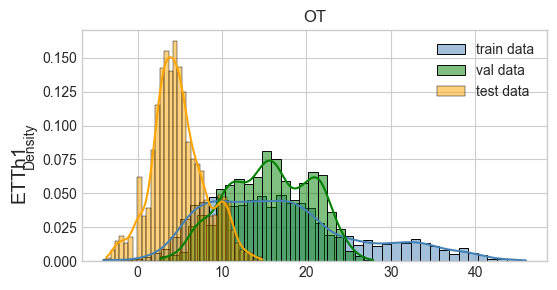

In [720]:
col = "OT"

plt.figure(figsize=(6, 3))
sns.histplot(train_data[col], color='steelblue', kde=True,
             stat='density', alpha=0.5, label='train data')
sns.histplot(val_data[col], color='green', kde=True,
             stat='density', alpha=0.5, label='val data')
sns.histplot(test_data[col], color='orange', kde=True,
             stat='density', alpha=0.5, label='test data')
plt.legend()
plt.xlabel('')
plt.ylabel('Density')
plt.title(col)
plt.suptitle("ETTh1", fontsize=14, x=0.02, y=0.5, rotation=90)
# plt.tight_layout()
plt.show()